## SWOT Tide Gauge Interpolation Time Series

In [2]:
# Import libraries
import xarray as xr
import warnings
warnings.filterwarnings('ignore')
import numpy as np
from glob import glob
#import swot_ssh_utils as swot
import os
import earthaccess
from dask.distributed import Client
import dask
import pandas as pd

from cartopy import crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib import pyplot as plt


import os
import re
from datetime import datetime

## Read in Data

In [3]:
#swot_b2_gom = xr.open_dataset('data/SWOT_datacube/swot_basic_l2_calval_gom.nc')
swot_e2_gom = xr.open_dataset('data/SWOT_datacube/swot_expert_l2_calval_gom.nc')
#swot_e3_gom = xr.open_dataset('data/SWOT_datacube/swot_expert_l3_calval_gom.nc')

In [4]:
#b2_df = swot_b2_gom.to_dataframe()

e2_df = swot_e2_gom.to_dataframe()

#e3_df = swot_e3_gom.to_dataframe()


In [5]:
swot_df = e2_df

if 'ssha_karin_2' in swot_df.columns:
    swot_var = 'ssha_karin_2'
else: swot_var = 'ssha_unfiltered'

swot_df_dropna = swot_df.dropna(axis=0, how='any', subset=[swot_var,'latitude', 'longitude', 'time'], 
                                inplace=False)


In [6]:
swot_df_dropna

time  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        2          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        3          0         2023-04-01 17:26:15.371241984   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:01.724514176   
                                        65         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   
                                        66         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   

                                                                                  time_tai  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        2          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        3          0         2023-04-01 17:26:52.371242624   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:38.724513664   
                                        65         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   
                                        66         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   

                                                              ssh_karin  \
timec                         num_lines num_pixels num_sides              
2023-04-01 17:26:58.949176039 0         1          0                NaN   
                                                   1                NaN   
                                        2          0                NaN   
                                                   1                NaN   
                                        3          0                NaN   
...                                                                 ...   
2023-07-04 02:46:18.150985132 281       64         1           -22.2355   
                                        65         0           -22.2041   
                                                   1           -22.2041   
                                        66         0           -22.1952   
                                                   1           -22.1952   

                                                              ssh_karin_qual  \
timec                         num_lines num_pixels num_sides                   
2023-04-01 17:26:58.949176039 0         1          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        2          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        3          0            2.684355e+09   
...                                                                      ...   
2023-07-04 02:46:18.1509

In [7]:
tg_mdf = pd.read_csv('data/GESLA4 GOM/GOMstations_metadata.csv')

valid_sites = ['S_Bird_Island', 'Baffin_Bay',  'Rincon_Del_San_Jose',
               'Port_Mansfield', 'Realitos_Peninsula',
                                   'South_Padre_Island_Cg_Station', 'Spi_Brazos_Santiago', 'Port_Isabel']

tg_mdf = tg_mdf[tg_mdf['site_name'].isin(valid_sites)]

lats = tg_mdf['latitude'].values
lons = tg_mdf['longitude'].values
names = tg_mdf['site_name'].values

print(names)

<StringArray>
[                  'Port_Isabel',                'Port_Mansfield',
                    'Baffin_Bay',           'Rincon_Del_San_Jose',
                 'S_Bird_Island', 'South_Padre_Island_Cg_Station',
           'Spi_Brazos_Santiago',            'Realitos_Peninsula']
Length: 8, dtype: str


In [8]:
# # Tide Gauge Data - daily average

# station_4564 = xr.open_dataset('data/GESLA4 GOM/data_GESLA5_gbl_tg_daily_NOLEAP_1993_2024_4564.nc')
# station_4591 = xr.open_dataset('data/GESLA4 GOM/data_GESLA5_gbl_tg_daily_NOLEAP_1993_2024_4591.nc')
# station_4830 = xr.open_dataset('data/GESLA4 GOM/data_GESLA5_gbl_tg_daily_NOLEAP_1993_2024_4830.nc')
# station_4887 = xr.open_dataset('data/GESLA4 GOM/data_GESLA5_gbl_tg_daily_NOLEAP_1993_2024_4887.nc')
# station_5517 = xr.open_dataset('data/GESLA4 GOM/data_GESLA5_gbl_tg_daily_NOLEAP_1993_2024_5517.nc')

In [9]:
import os

# Create the output directory if it doesn't exist
output_dir = '/home/nsv9/data/GESLA_LM/'
os.makedirs(output_dir, exist_ok=True)

In [10]:
# Load all netCDF files
files = glob(os.path.join(output_dir, '*_calval_LM.nc'))
stations_data = {}
for file in files:
    ds = xr.open_dataset(file)
    station_name = file.split('/')[-1].replace('_calval_LM.nc', '')
    stations_data[station_name] = ds

# reorder stations_data to match the order of valid_sites
ordered_stations_data = {}
for station_name in valid_sites:
    if station_name in stations_data:
        ordered_stations_data[station_name] = stations_data[station_name]
stations_data = ordered_stations_data

In [11]:
stations_data

{'S_Bird_Island': <xarray.Dataset> Size: 90kB
 Dimensions:        (time: 2257)
 Coordinates:
   * time           (time) datetime64[ns] 18kB 2023-04-01 ... 2023-07-04
 Data variables:
     sea_level      (time) float64 18kB ...
     rel_sea_level  (time) float64 18kB ...
     qc_flag        (time) int64 18kB ...
     use_flag       (time) int64 18kB ...
     latitude       float64 8B ...
     longitude      float64 8B ...,
 'Baffin_Bay': <xarray.Dataset> Size: 89kB
 Dimensions:        (time: 2226)
 Coordinates:
   * time           (time) datetime64[ns] 18kB 2023-04-01 ... 2023-07-04
 Data variables:
     sea_level      (time) float64 18kB ...
     rel_sea_level  (time) float64 18kB ...
     qc_flag        (time) int64 18kB ...
     use_flag       (time) int64 18kB ...
     latitude       float64 8B ...
     longitude      float64 8B ...,
 'Rincon_Del_San_Jose': <xarray.Dataset> Size: 90kB
 Dimensions:        (time: 2253)
 Coordinates:
   * time           (time) datetime64[ns] 18kB 2023-

In [12]:
def splice_after_date(data, date1, date2):
    return data.sel(time=slice(date1, date2))

def fix_time_and_sl(data):
    #data = data.rename({'sl_raw': 'sea_level'})
    data = data.assign_coords(time=pd.to_datetime([t.strftime("%Y-%m-%d %H:%M:%S") 
                                                   for t in data.time.values]))
    return data

def rel_sea_level(data):
    data['sea_level'] = data['sea_level'] - data['sea_level'].mean()
    return data

In [13]:
def process_tg_data(data, date1, date2):
    data = fix_time_and_sl(data)
    data = splice_after_date(data, date1, date2)
    #data = rel_sea_level(data)
    return data

In [14]:
stations_data['Baffin_Bay']
# so there's no need for processing

<xarray.Dataset> Size: 89kB
Dimensions:        (time: 2226)
Coordinates:
  * time           (time) datetime64[ns] 18kB 2023-04-01 ... 2023-07-04
Data variables:
    sea_level      (time) float64 18kB ...
    rel_sea_level  (time) float64 18kB ...
    qc_flag        (time) int64 18kB ...
    use_flag       (time) int64 18kB ...
    latitude       float64 8B ...
    longitude      float64 8B ...

## Interpolate SWOT and TG 
- Haversine distance
- threshold of 70-90 points to get a full comparison with SWOT, 90 is better for paper quality 

In [15]:
# Function to filter closest timeseries with threshold using Haversine distance

def filter_closest_timeseries_with_threshold(
    station_name, df,
    target_lat,
    target_lon,
    lat_col='lat',
    lon_col='lon',
    time_col='time',
    value_col='value',
    min_count=70
):
    # 1. Find unique lat/lon pairs
    unique_points = df[[lat_col, lon_col]].drop_duplicates().reset_index(drop=True)

    def haversine(lat1, lon1, lat2, lon2):
        from numpy import radians, sin, cos, sqrt, arctan2
        R = 6371.0
        lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
        dlat = lat2 - lat1
        dlon = lon2 - lon1
        a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
        c = 2 * arctan2(sqrt(a), sqrt(1 - a))
        return R * c

    # 2. For each unique lat/lon, count number of timeseries entries
    counts = (
        df.groupby([lat_col, lon_col])[time_col]
        .count()
        .reset_index()
        .rename(columns={time_col: 'n_points'})
    )

    # 3. Merge back to unique_points, keep only those with sufficient entries
    unique_points = unique_points.merge(counts, on=[lat_col, lon_col], how='left')
    eligible_points = unique_points[unique_points['n_points'] >= min_count].copy()

    if eligible_points.empty:
        print("No grid point meets the minimum time series threshold.")
        return pd.DataFrame()

    # 4. Calculate distance to target for eligible points
    eligible_points['distance'] = eligible_points.apply(
        lambda row: haversine(target_lat, target_lon, row[lat_col], row[lon_col]), axis=1
    )
    closest = eligible_points.loc[eligible_points['distance'].idxmin()]
    closest_lat, closest_lon = closest[lat_col], closest[lon_col]
    print(f"Closest point with at least {min_count} entries: ({closest_lat:.4f}, {closest_lon:.4f}) with {closest['n_points']} entries.")

    # 5. Filter original dataframe for all entries at that point
    filtered = df[(df[lat_col] == closest_lat) & (df[lon_col] == closest_lon)].copy()

    # # 6. Optional plot
    # import matplotlib.pyplot as plt
    # plt.plot(filtered[time_col], filtered[value_col])
    # plt.xlabel('Time')
    # plt.ylabel(value_col)
    # plt.title(f'SWOT vs TG Time series at {station_name}: ({target_lat:.2f}, {target_lon:.2f})')
    # plt.text(0.05, 0.95, f'Closest point at ({closest_lat:.4f}, {closest_lon:.4f})', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    # plt.show()

    # 7. Return filtered dataframe
    return filtered

In [16]:
valid_sites

['S_Bird_Island',
 'Baffin_Bay',
 'Rincon_Del_San_Jose',
 'Port_Mansfield',
 'Realitos_Peninsula',
 'South_Padre_Island_Cg_Station',
 'Spi_Brazos_Santiago',
 'Port_Isabel']

In [17]:
min_count = 90

#dictionary of time series for each station
swot_interp = {}

for site in valid_sites:
    print(f"Processing site: {site}")
    site_data = stations_data[site]
    swot_interp[site] = filter_closest_timeseries_with_threshold(
        station_name, swot_df_dropna, target_lat=site_data['latitude'], 
        target_lon=site_data['longitude'], lat_col='latitude', lon_col='longitude',
        time_col='time', value_col='ssha_karin_2', min_count=min_count)

    

Processing site: S_Bird_Island
Closest point with at least 90 entries: (27.4785, -97.3223) with 180 entries.
Processing site: Baffin_Bay
Closest point with at least 90 entries: (27.2994, -97.4094) with 180 entries.
Processing site: Rincon_Del_San_Jose
Closest point with at least 90 entries: (26.8263, -97.4982) with 180 entries.
Processing site: Port_Mansfield
Closest point with at least 90 entries: (26.5630, -97.4248) with 180 entries.
Processing site: Realitos_Peninsula
Closest point with at least 90 entries: (26.2559, -97.2822) with 180 entries.
Processing site: South_Padre_Island_Cg_Station
Closest point with at least 90 entries: (26.0730, -97.1648) with 180 entries.
Processing site: Spi_Brazos_Santiago
Closest point with at least 90 entries: (26.0730, -97.1648) with 180 entries.
Processing site: Port_Isabel
Closest point with at least 90 entries: (26.0635, -97.2239) with 180 entries.


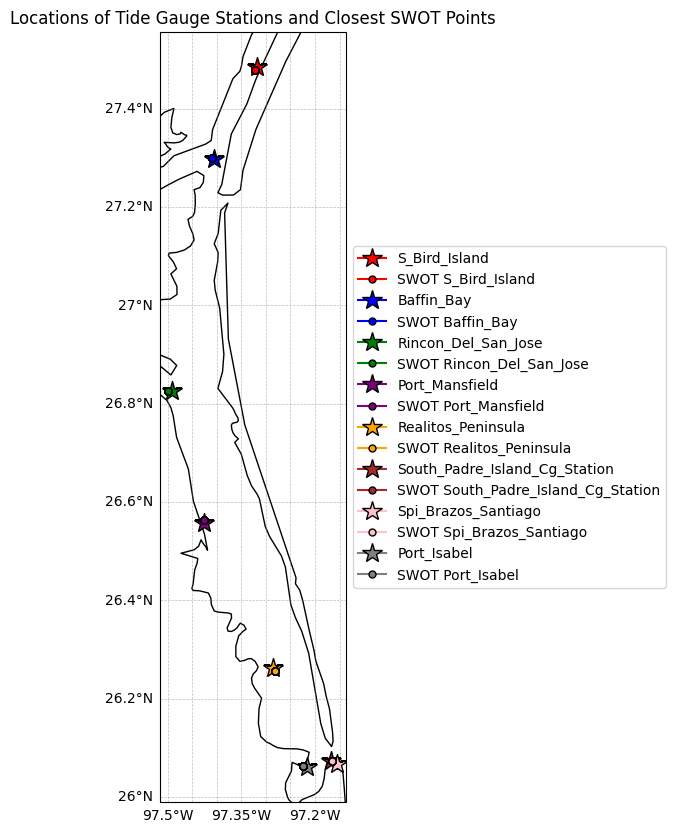

In [18]:
# Plot location of swot points and station points to visually confirm closest points
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax.set_extent([-100, -96, 25, 31], crs=ccrs.PlateCarree()) # Gulf of Mexico
# Add latitude and longitude gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.LAND, facecolor='white')
ax.add_feature(cfeature.OCEAN, facecolor='white')
# plot station locations and swot closest points
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray']
for idx, site in enumerate(valid_sites):
    if site in stations_data and site in swot_interp:
        tg_data = stations_data[site]
        swot_data = swot_interp[site]
        color = colors[idx % len(colors)]
        ax.plot(tg_data['longitude'].values, tg_data['latitude'].values, 
                marker='*', color=color, markersize=15, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=site)
        ax.plot(swot_data['longitude'].values, swot_data['latitude'].values, 
                marker='o', color=color, markersize=5, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=f'SWOT {site}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Locations of Tide Gauge Stations and Closest SWOT Points')
plt.show()

## Plot Timeseries 

In [19]:
# function to plot time series of swot and tg data for a station
def plot_swot_tg_time_series(swot_df, tg_ds, station_name):
    target_lat = tg_ds['latitude'].values
    target_lon = tg_ds['longitude'].values

    plt.figure(figsize=(10, 5))
    plt.plot(swot_df['time'], swot_df['ssha_karin'] + swot_df['height_cor_xover'], label='ssha_karin', color = 'green') 
    plt.plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color = 'red')
    plt.plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color = 'lightblue')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(f'SWOT vs TG Hourly at {station_name}: ({target_lat:.2f}, {target_lon:.2f})')
    plt.text(0.05, 0.95, f'SWOT interpolation from ({swot_df["latitude"].values[0]:.4f}, {swot_df["longitude"].values[0]:.4f})',
              transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left')
    plt.legend()
    plt.tight_layout()
    plt.show()



In [20]:
# Function to Demeaned SWOT vs TG Hourly time series for each station
def plot_swotdm_tghrly_time_series(swot_df, tg_ds, station_name):
    target_lat = tg_ds['latitude'].values
    target_lon = tg_ds['longitude'].values

    plt.figure(figsize=(10, 5))
    plt.plot(swot_df['time'], swot_df['ssha_karin'] + swot_df['height_cor_xover'], label='ssha_karin',color = 'green') 
    plt.plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color = 'red')
    plt.plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color = 'lightblue')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(f'SWOT (Demeaned) vs TG Hourly at {station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual = 0')
    plt.text(0.05, 0.95, f'SWOT interpolation from ({swot_df["latitude"].values[0]:.4f}, {swot_df["longitude"].values[0]:.4f})',
              transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left')
    plt.legend()
    plt.tight_layout()
    plt.show()



In [ ]:
# Function to Demeaned SWOT vs TG Hourly time series for each station
def plot_swotdm_tghrly_time_series_ibc(swot_df, tg_ds, tg_ds_ibc, station_name):
    target_lat = tg_ds['latitude'].values
    target_lon = tg_ds['longitude'].values

    # plot both tg_ds and tg_ds_ibc on same plot for comparison
    plt.figure(figsize=(10, 5))
    plt.plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color = 'red')
    plt.plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color = 'lightblue')
    plt.plot(tg_ds_ibc['time'].values, tg_ds_ibc['rel_sea_level'].values, label='Tide Gauge DAC Corrected', color = 'orange')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(f'SWOT (Demeaned) vs DAC-Corrected TG Hourly at {station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual = 0')
    plt.text(0.05, 0.95, f'SWOT interpolation from ({swot_df["latitude"].values[0]:.4f}, {swot_df["longitude"].values[0]:.4f})',
                transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left')
    plt.legend()
    plt.tight_layout()
    plt.show()
    



In [32]:
# function to plot time series of swot and tg data for a station qual < 1e9
def plot_swot_tg_time_series_qual1(swot_df, tg_ds, station_name):
    target_lat = tg_ds['latitude'].values
    target_lon = tg_ds['longitude'].values

    plt.figure(figsize=(10, 5))
    plt.plot(swot_df['time'], swot_df['ssha_karin'] + swot_df['height_cor_xover'], label='ssha_karin', color = 'green') 
    plt.plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color = 'blue')
    plt.plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color = 'red')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(f'SWOT vs TG Hourly at {station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual < 1e9')
    plt.text(0.05, 0.95, f'SWOT interpolation from ({swot_df["latitude"].values[0]:.4f}, {swot_df["longitude"].values[0]:.4f})',
              transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left')
    plt.legend()
    plt.tight_layout()
    plt.show()



In [33]:
# function to plot time series of swot and tg data for a station qual = 0
def plot_swot_tg_time_series_qual2(swot_df, tg_ds, station_name):
    target_lat = tg_ds['latitude'].values
    target_lon = tg_ds['longitude'].values

    plt.figure(figsize=(10, 5))
    plt.plot(swot_df['time'], swot_df['ssha_karin'] + swot_df['height_cor_xover'], label='ssha_karin', color = 'green') 
    plt.plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color = 'blue')
    plt.plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color = 'red')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.title(f'SWOT vs TG Hourly at {station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual = 0')
    plt.text(0.05, 0.95, f'SWOT interpolation from ({swot_df["latitude"].values[0]:.4f}, {swot_df["longitude"].values[0]:.4f})',
              transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='left')
    plt.legend()
    plt.tight_layout()
    plt.show()



In [24]:
# plot function like above that plots all stations as subplots 
def plot_swotdm_tghrly_time_series_subplots(swot_dfs, tg_dss, station_names):
    num_stations = len(station_names)
    fig, axes = plt.subplots(num_stations, 1, figsize=(12, 5 * num_stations), sharex=True)

    for i, station_name in enumerate(station_names):
        swot_df = swot_dfs[station_name]
        tg_ds = tg_dss[station_name]

        target_lat = tg_ds['latitude'].values
        target_lon = tg_ds['longitude'].values

        axes[i].plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color='red')
        axes[i].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='lightblue')
        axes[i].set_title(f'{station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual = 0')
        axes[i].set_ylabel('Value')
        axes[i].legend()
    
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.suptitle('SWOT E2 vs TG Hourly Time Series', fontsize=16)
    plt.tight_layout()

    plt.show()

In [23]:
# plot function like above that plots all stations as subplots 
def plot_swotdm_tghrly_time_series_subplots_ibc(swot_dfs, tg_dss, station_names):
    num_stations = len(station_names)
    fig, axes = plt.subplots(num_stations, 1, figsize=(12, 5 * num_stations), sharex=True)

    for i, station_name in enumerate(station_names):
        swot_df = swot_dfs[station_name]
        tg_ds = tg_dss[station_name]
        tg_ds_ibc = tg_dss_ibc[station_name]

        target_lat = tg_ds['latitude'].values
        target_lon = tg_ds['longitude'].values

        axes[i].plot(swot_df['time'], swot_df['ssha_karin_2'] + swot_df['height_cor_xover'], label='ssha_karin_2', color='red')
        axes[i].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='lightblue')
        axes[i].plot(tg_ds_ibc['time'].values, tg_ds_ibc['rel_sea_level'].values, label='Tide Gauge IBC Corrected', color='orange')
        axes[i].set_title(f'{station_name}: ({target_lat:.2f}, {target_lon:.2f}), qual = 0')
        axes[i].set_ylabel('Value')
        axes[i].legend()
    
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

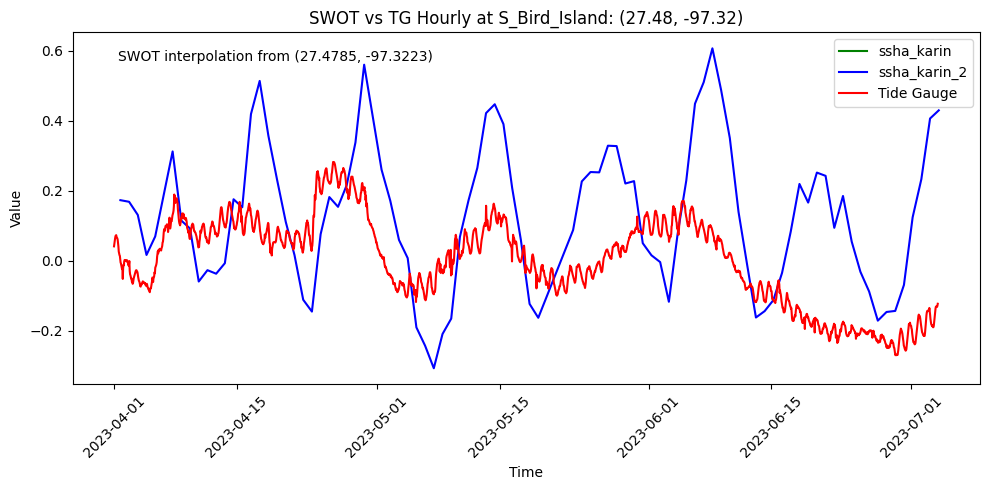

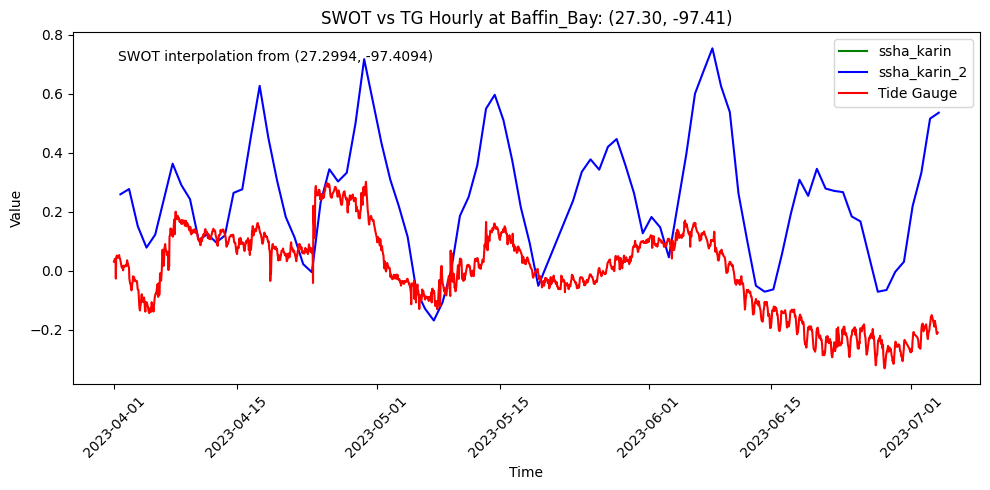

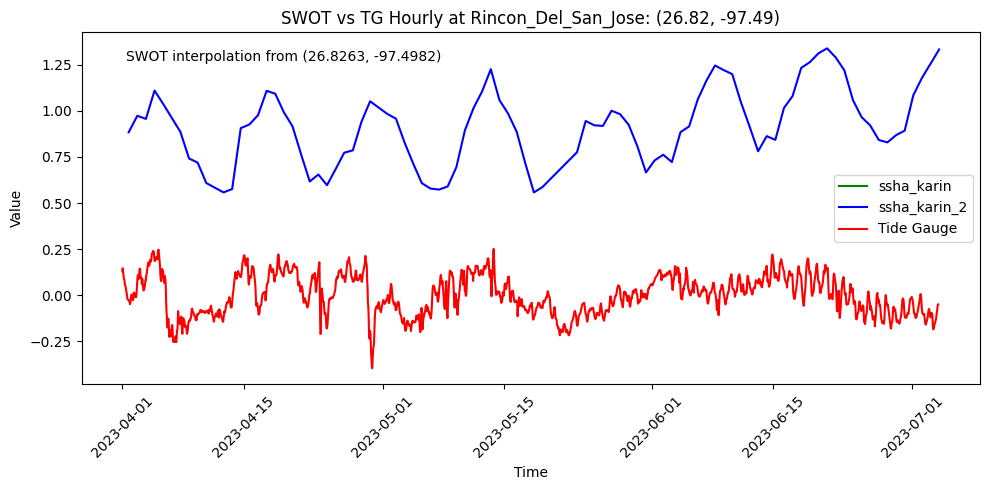

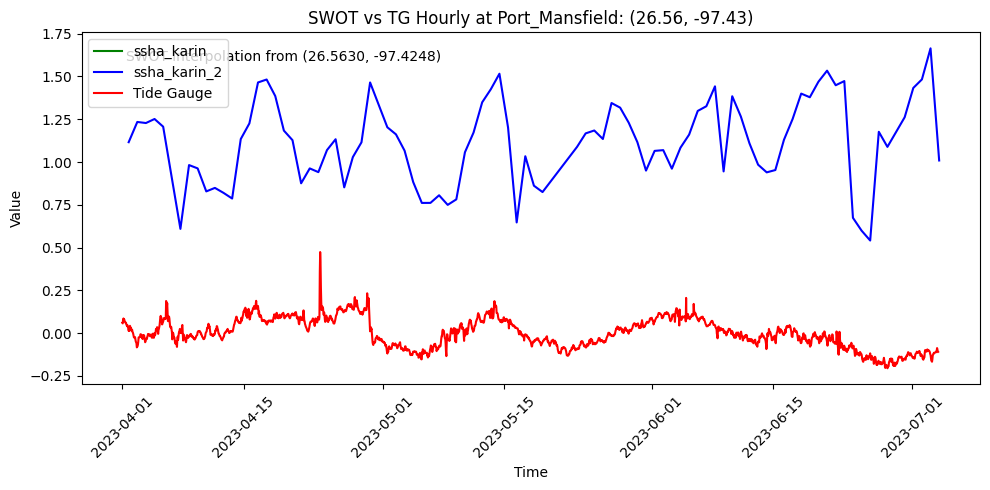

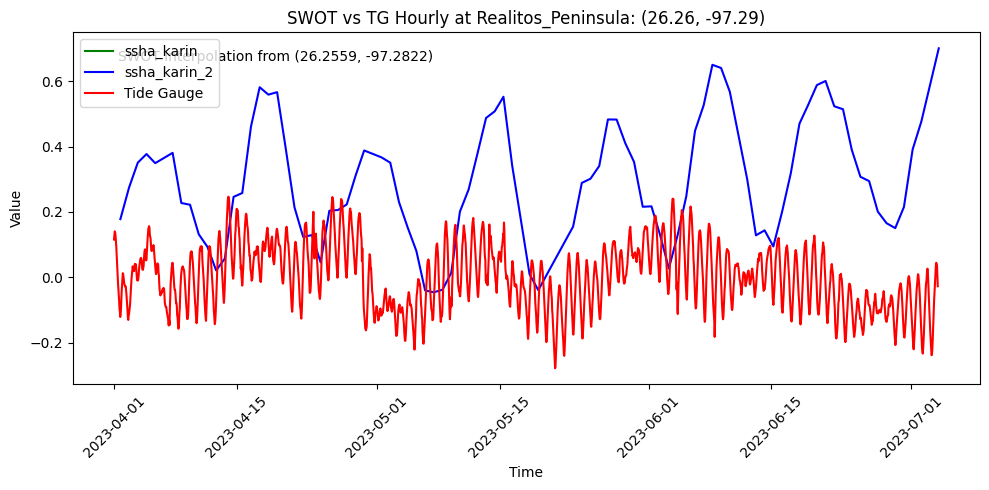

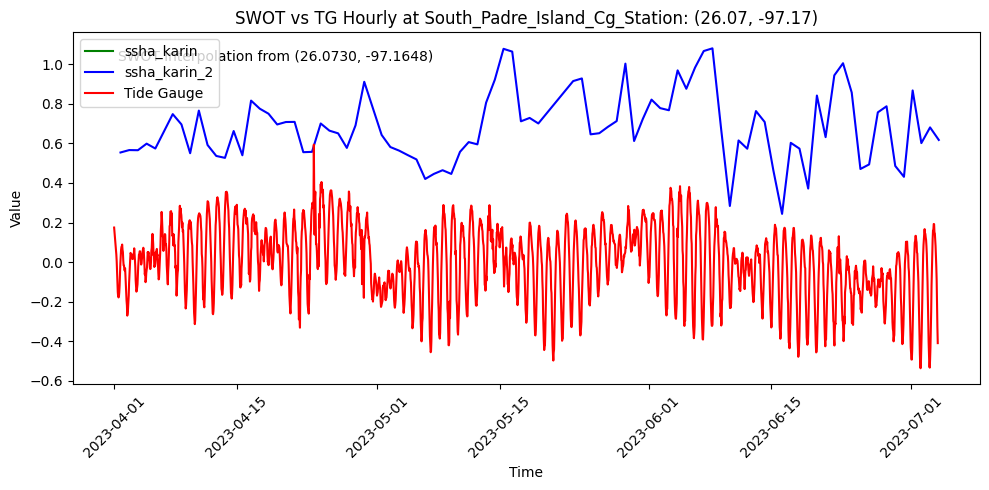

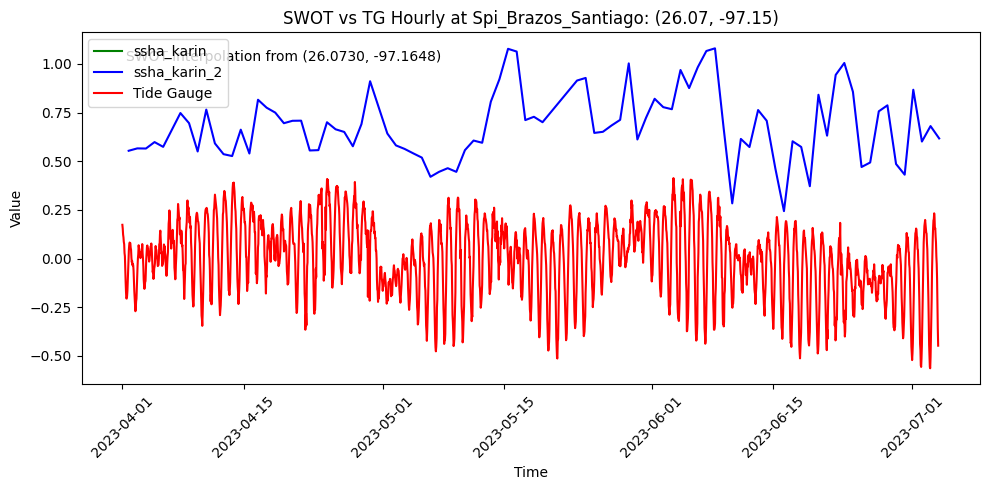

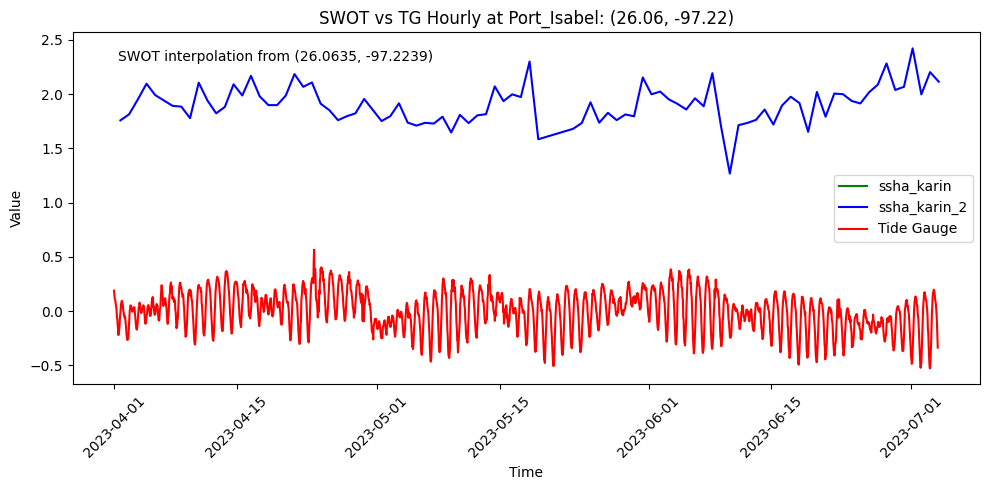

In [20]:
# Plot for all stations using the dictionaries
for site in stations_data:
    if site in swot_interp and site in stations_data:
        plot_swot_tg_time_series(swot_interp[site], stations_data[site], site)

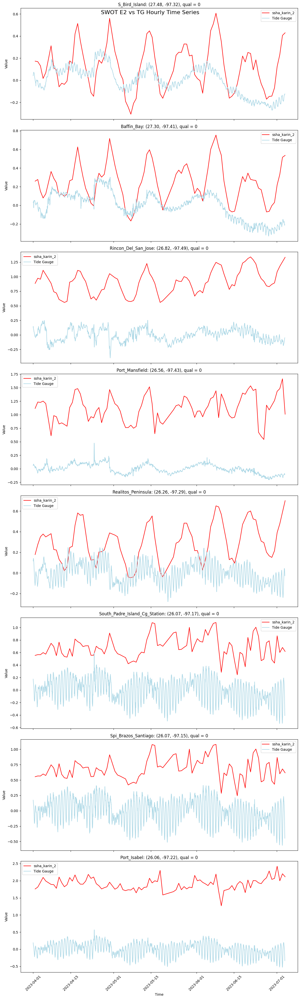

In [25]:
plot_swotdm_tghrly_time_series_subplots(swot_interp, stations_data, valid_sites)

In [21]:
swot_interp['S_Bird_Island']['ssha_karin_2'].mean()

np.float64(-0.44546)

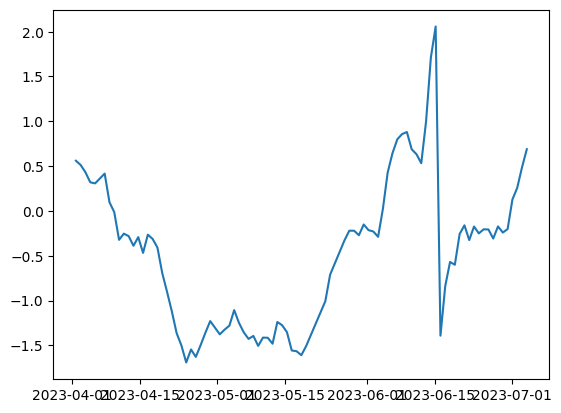

In [22]:
plt.plot(swot_interp['S_Bird_Island']['time'], swot_interp['S_Bird_Island']['ssha_karin_2'], label='S_Bird_Island')

In [23]:
def demean_swot(swot_df):
    swot_demeaned = swot_df.copy()
    swot_demeaned['ssha_karin_2'] = swot_demeaned['ssha_karin_2'] - (swot_demeaned['ssha_karin_2']+swot_demeaned['height_cor_xover']).mean()
    swot_demeaned['ssha_karin'] = swot_demeaned['ssha_karin'] - (swot_demeaned['ssha_karin']+swot_demeaned['height_cor_xover']).mean()

    return swot_demeaned


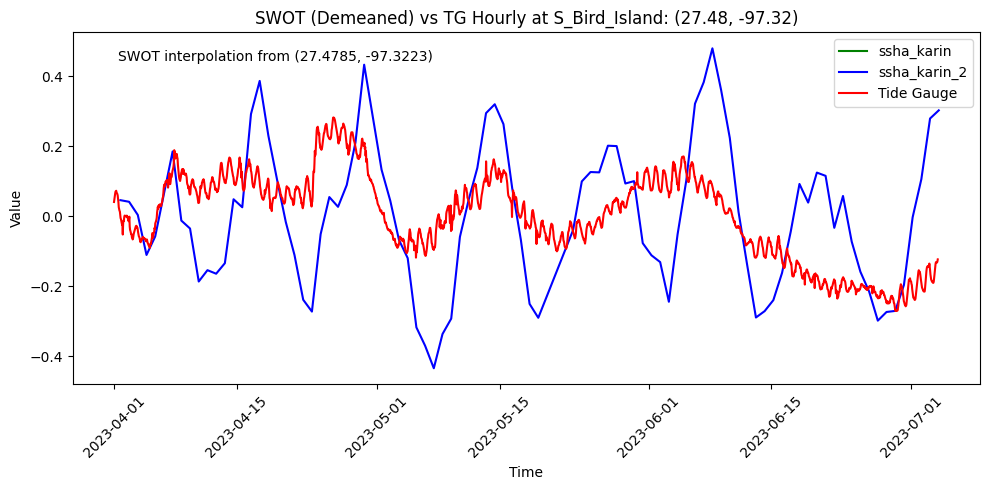

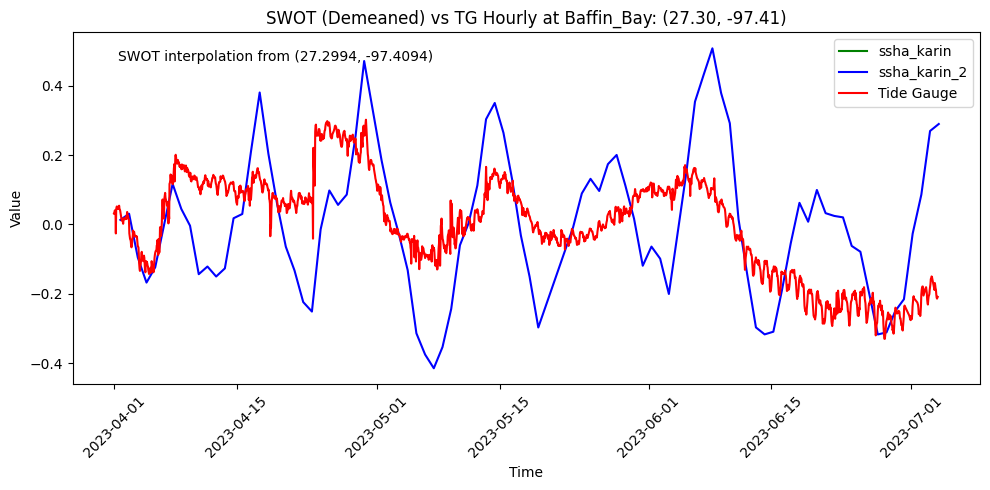

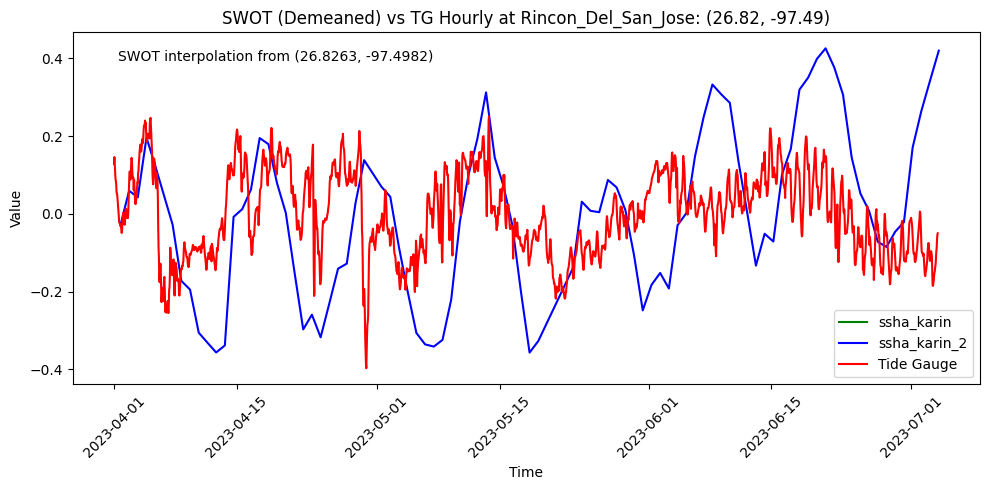

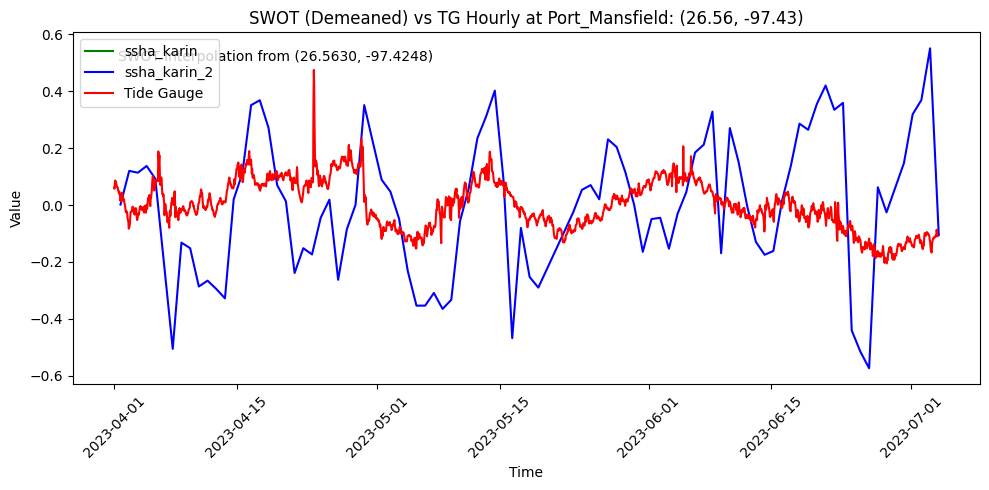

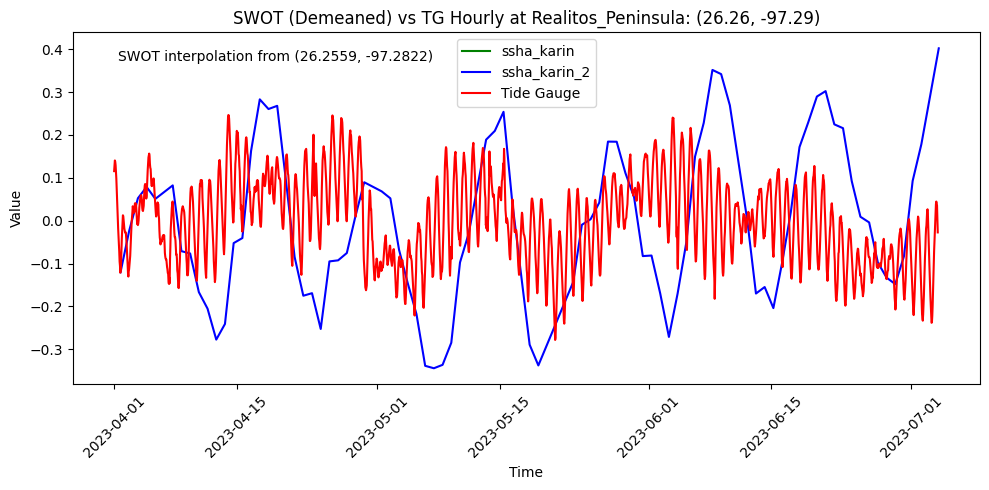

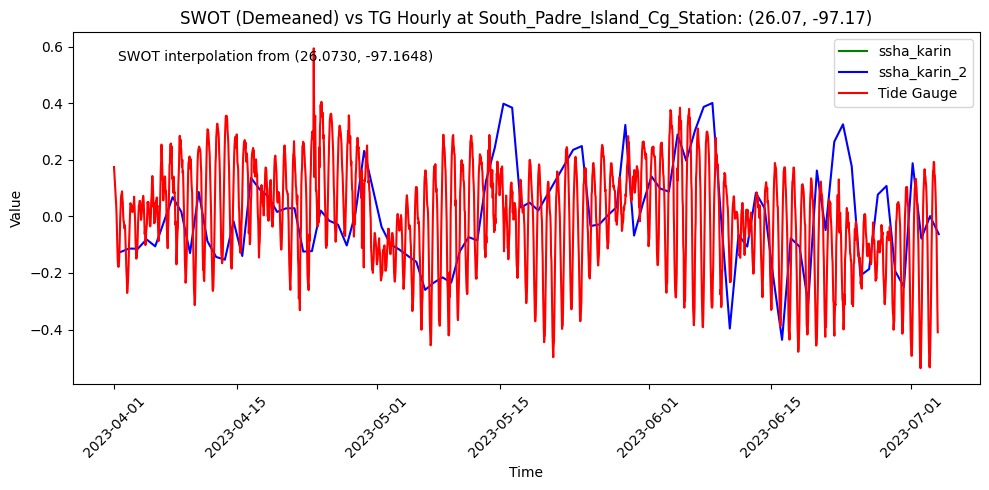

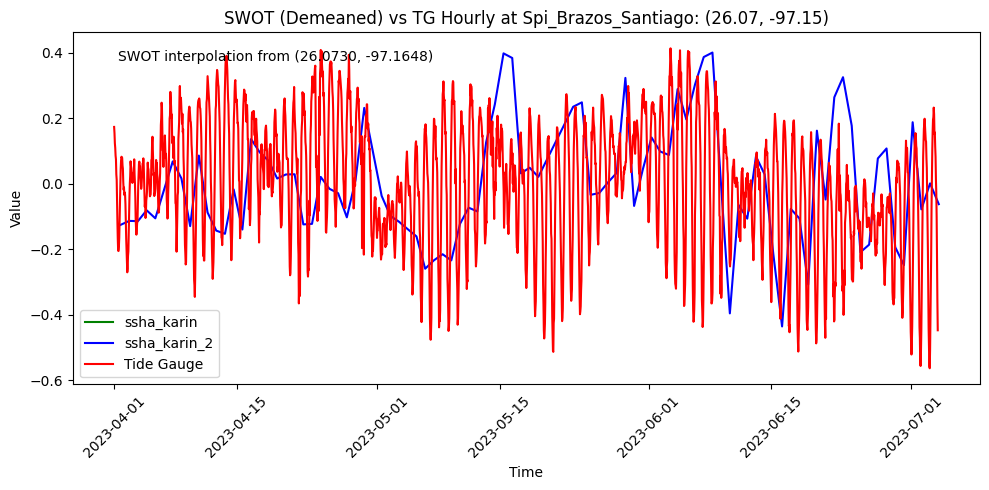

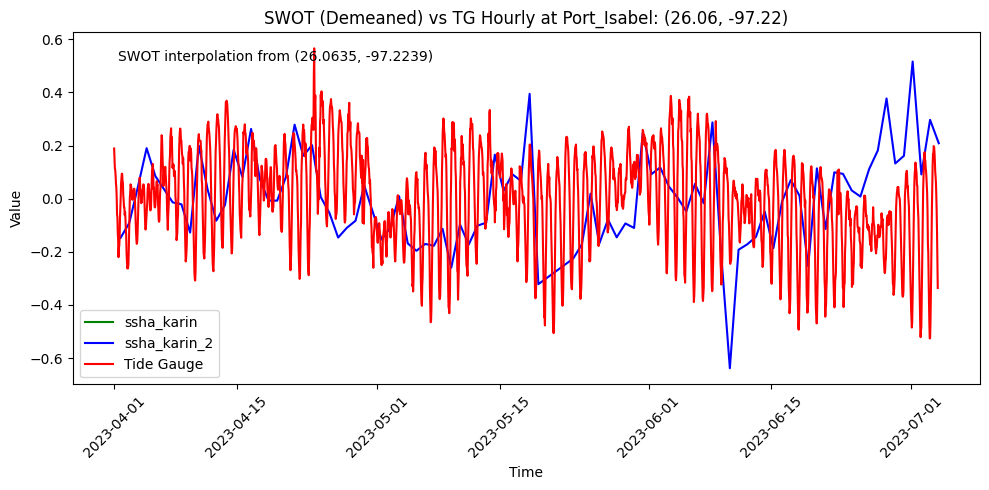

In [24]:
# Use the swot_interp dictionary instead of individual variables
swot_interp_demeaned = {}
for site in valid_sites:
    if site in swot_interp:
        swot_interp_demeaned[site] = demean_swot(swot_interp[site])

# Plot for all stations
for site in valid_sites:
    if site in swot_interp_demeaned and site in stations_data:
        plot_swotdm_tghrly_time_series(swot_interp_demeaned[site], stations_data[site], site)


In [ ]:
plot_swotdm_tghrly_time_series_subplots(swot_interp_demeaned, stations_data, valid_sites)

## Quality Investigation 

- filter first SWOT by less than 1e9 to remove "unusable data" quality flag 2e9
- plot new time series and maps to see how far away new interpolated points are
- then filter SWOT by qual == 0 to get only perfect no issue data

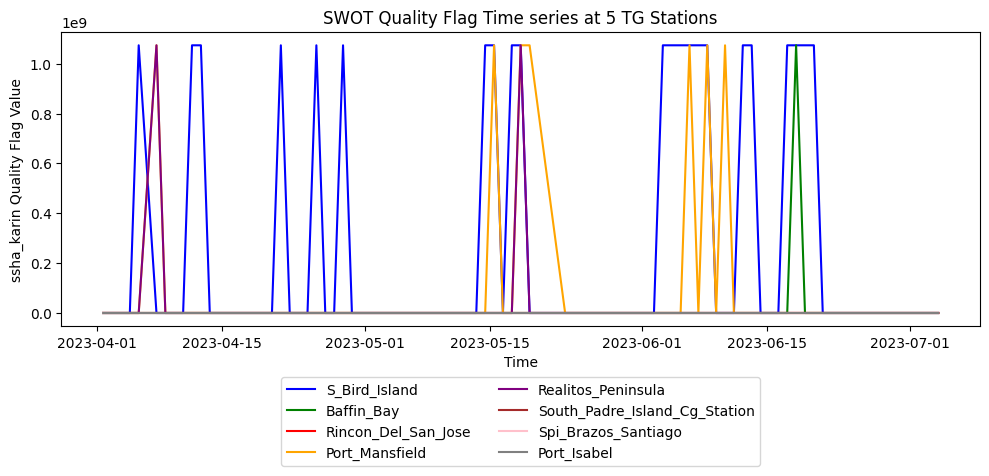

In [25]:
# plot quality flags for all stations on same plot, different colors for each station

plt.figure(figsize=(10, 5))
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'gray']

for idx, site in enumerate(valid_sites):
    if site in swot_interp:
        plt.plot(swot_interp[site]['time'], swot_interp[site]['ssha_karin_2_qual'], 
                label=site, color=colors[idx % len(colors)])

plt.xlabel('Time')  
plt.ylabel('ssha_karin Quality Flag Value')
#plt.xticks(rotation=45)
plt.title('SWOT Quality Flag Time series at 5 TG Stations')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.tight_layout()
plt.savefig('figures/swot_tg_interp/ssa_karin_quality_flags_all_stations.png', dpi=300)
plt.show()

In [27]:
# find periods of nonzero quality flags for each station and print them out
def find_nonzero_quality_periods(swot_df, station_name):
    swot_df['time'] = pd.to_datetime(swot_df['time'])
    nonzero_qual = swot_df[swot_df['ssha_karin_2_qual'] != 0]
    if nonzero_qual.empty:
        print(f"No nonzero quality flags for {station_name}")
        return
    nonzero_qual['time_diff'] = nonzero_qual['time'].diff().dt.total_seconds().fillna(0)
    # Define a new period whenever the time difference is greater than 1 day (86400 seconds)
    nonzero_qual['period'] = (nonzero_qual['time_diff'] > 86400).cumsum()
    periods = nonzero_qual.groupby('period')['time'].agg(['min', 'max'])
    print(f"Nonzero quality flag periods for {station_name}:")
    print(periods)

# find_nonzero_quality_periods(swot_s4564, 'Port Isabel')
# find_nonzero_quality_periods(swot_s4591, 'Port Mansfield')
# find_nonzero_quality_periods(swot_s4830, 'Realitos Peninsula')
# find_nonzero_quality_periods(swot_s4887, 'Rincon Del San Jose')
# find_nonzero_quality_periods(swot_s5517, 'South Padre Island CG Station')

In [28]:
swot_df_dropna

time  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        2          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        3          0         2023-04-01 17:26:15.371241984   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:01.724514176   
                                        65         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   
                                        66         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   

                                                                                  time_tai  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        2          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        3          0         2023-04-01 17:26:52.371242624   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:38.724513664   
                                        65         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   
                                        66         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   

                                                              ssh_karin  \
timec                         num_lines num_pixels num_sides              
2023-04-01 17:26:58.949176039 0         1          0                NaN   
                                                   1                NaN   
                                        2          0                NaN   
                                                   1                NaN   
                                        3          0                NaN   
...                                                                 ...   
2023-07-04 02:46:18.150985132 281       64         1           -22.2355   
                                        65         0           -22.2041   
                                                   1           -22.2041   
                                        66         0           -22.1952   
                                                   1           -22.1952   

                                                              ssh_karin_qual  \
timec                         num_lines num_pixels num_sides                   
2023-04-01 17:26:58.949176039 0         1          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        2          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        3          0            2.684355e+09   
...                                                                      ...   
2023-07-04 02:46:18.1509

In [29]:
# filter by quality flag, remove unusable data

swot_df1 = swot_df_dropna[swot_df_dropna['ssha_karin_2_qual'] < 1e9]

swot_df1

time  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        2          0         2023-04-01 17:26:15.371241984   
                                                   1         2023-04-01 17:26:15.371241984   
                                        3          0         2023-04-01 17:26:15.371241984   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:01.724514176   
                                        65         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   
                                        66         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   

                                                                                  time_tai  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 0         1          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        2          0         2023-04-01 17:26:52.371242624   
                                                   1         2023-04-01 17:26:52.371242624   
                                        3          0         2023-04-01 17:26:52.371242624   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       64         1         2023-07-04 02:47:38.724513664   
                                        65         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   
                                        66         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   

                                                              ssh_karin  \
timec                         num_lines num_pixels num_sides              
2023-04-01 17:26:58.949176039 0         1          0                NaN   
                                                   1                NaN   
                                        2          0                NaN   
                                                   1                NaN   
                                        3          0                NaN   
...                                                                 ...   
2023-07-04 02:46:18.150985132 281       64         1           -22.2355   
                                        65         0           -22.2041   
                                                   1           -22.2041   
                                        66         0           -22.1952   
                                                   1           -22.1952   

                                                              ssh_karin_qual  \
timec                         num_lines num_pixels num_sides                   
2023-04-01 17:26:58.949176039 0         1          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        2          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        3          0            2.684355e+09   
...                                                                      ...   
2023-07-04 02:46:18.1509

Closest point with at least 90 entries: (27.4785, -97.3223) with 136.0 entries.


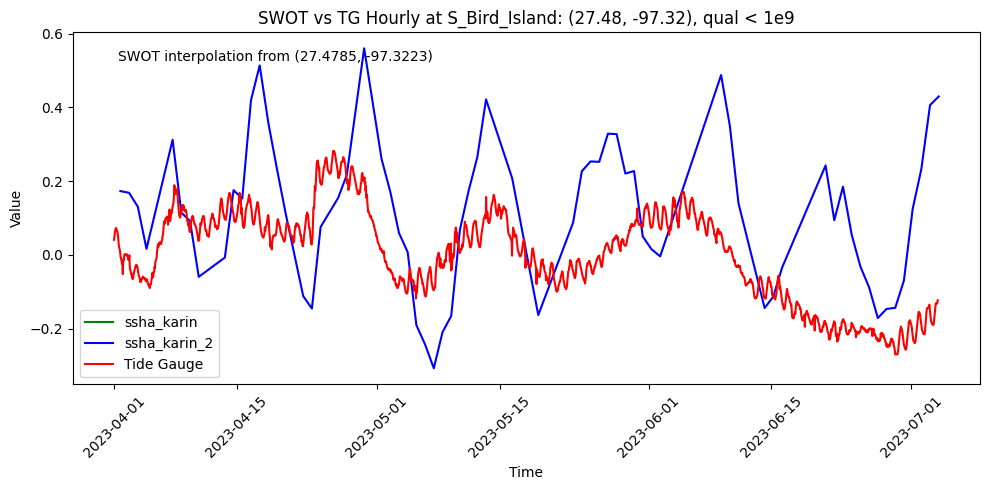

Closest point with at least 90 entries: (27.2994, -97.4094) with 178.0 entries.


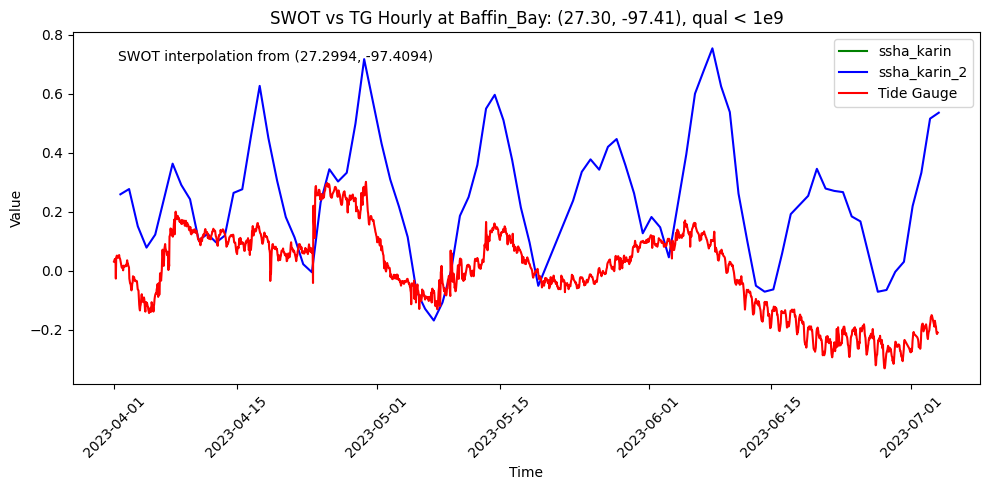

Closest point with at least 90 entries: (26.8263, -97.4982) with 180.0 entries.


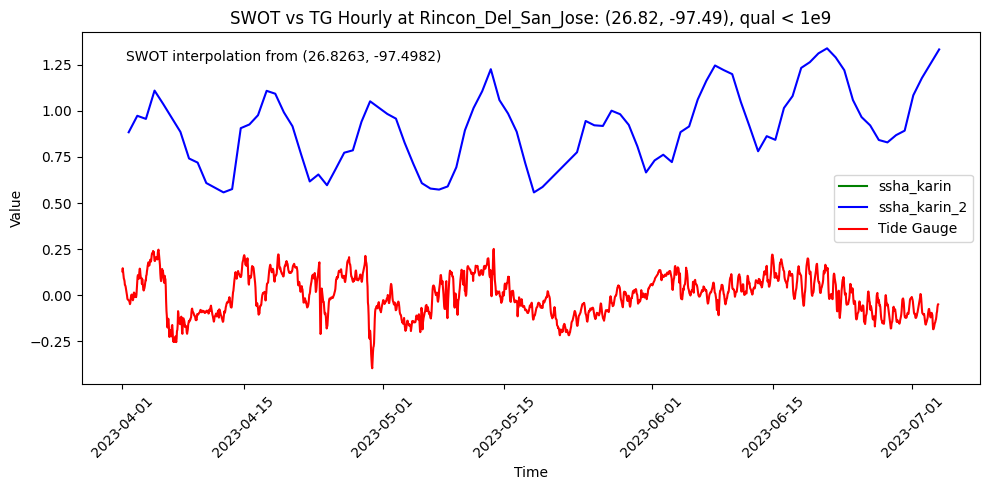

Closest point with at least 90 entries: (26.5630, -97.4248) with 166.0 entries.


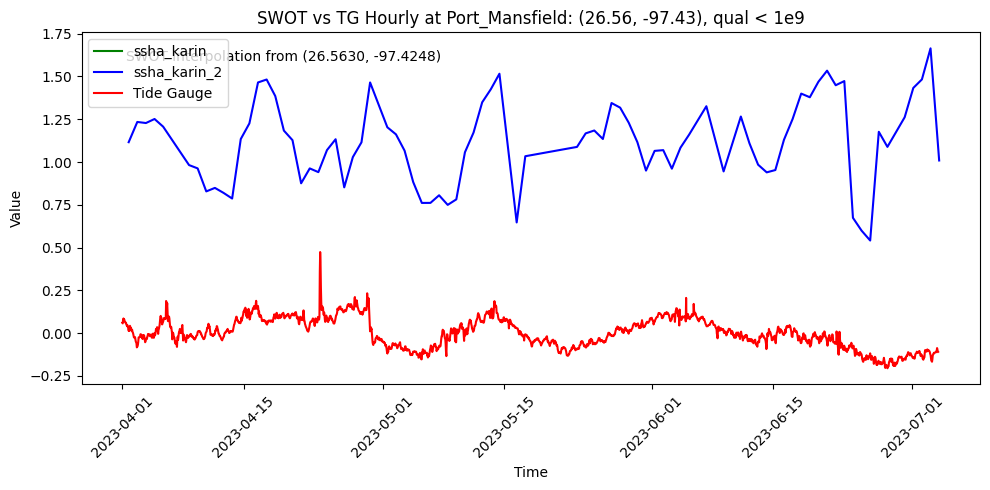

Closest point with at least 90 entries: (26.2559, -97.2822) with 176.0 entries.


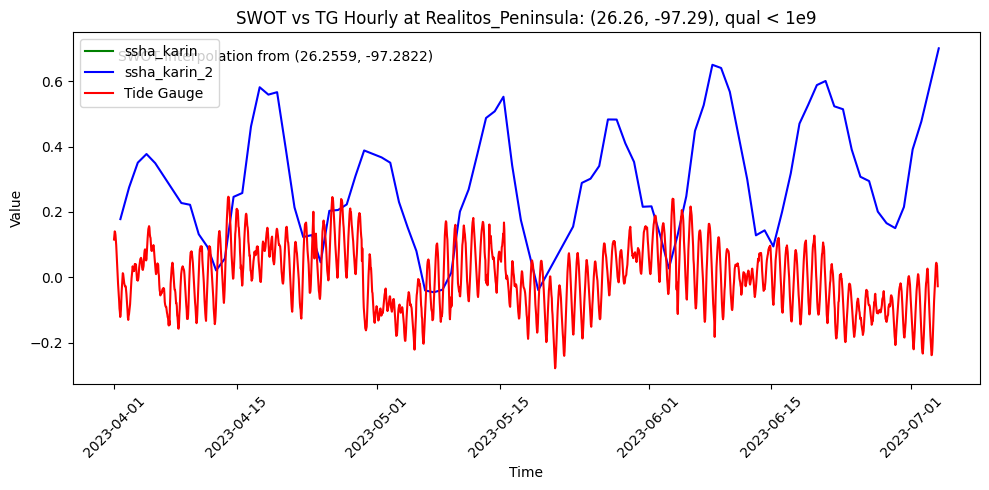

Closest point with at least 90 entries: (26.0730, -97.1648) with 180.0 entries.


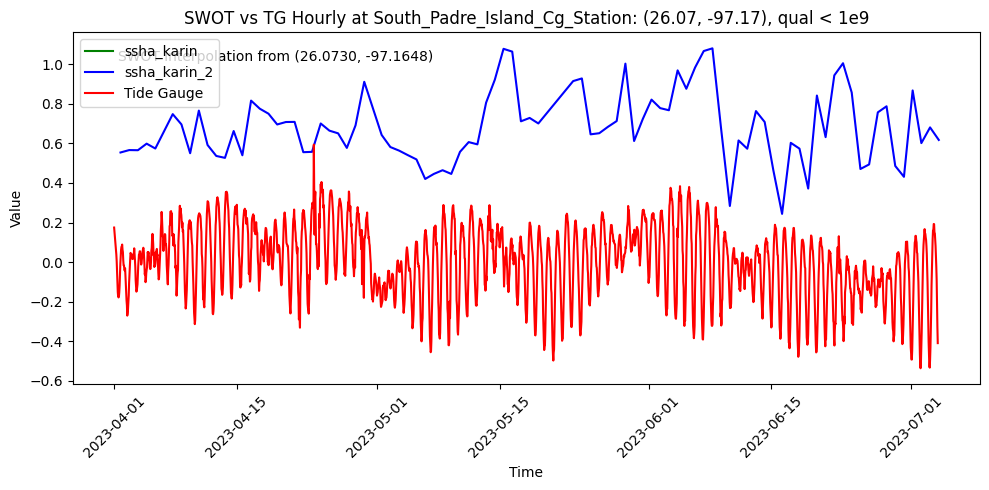

Closest point with at least 90 entries: (26.0730, -97.1648) with 180.0 entries.


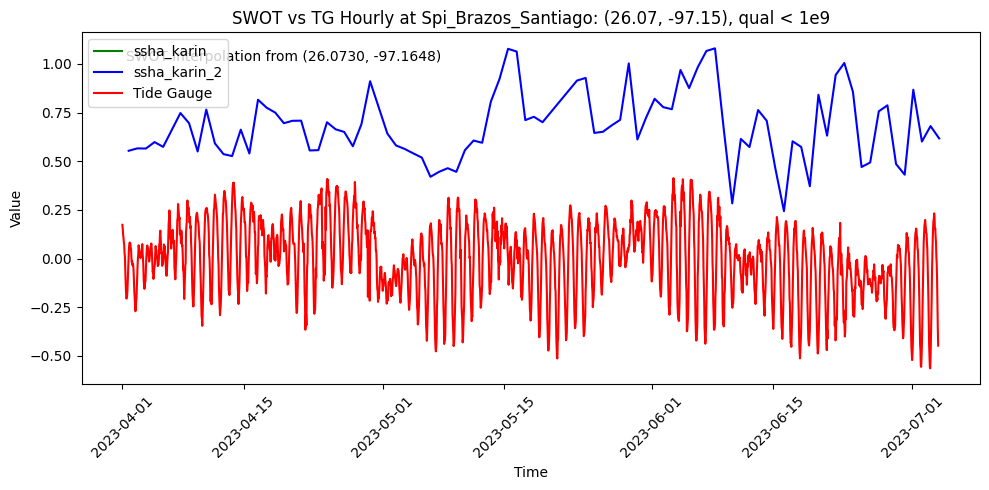

Closest point with at least 90 entries: (26.0635, -97.2239) with 180.0 entries.


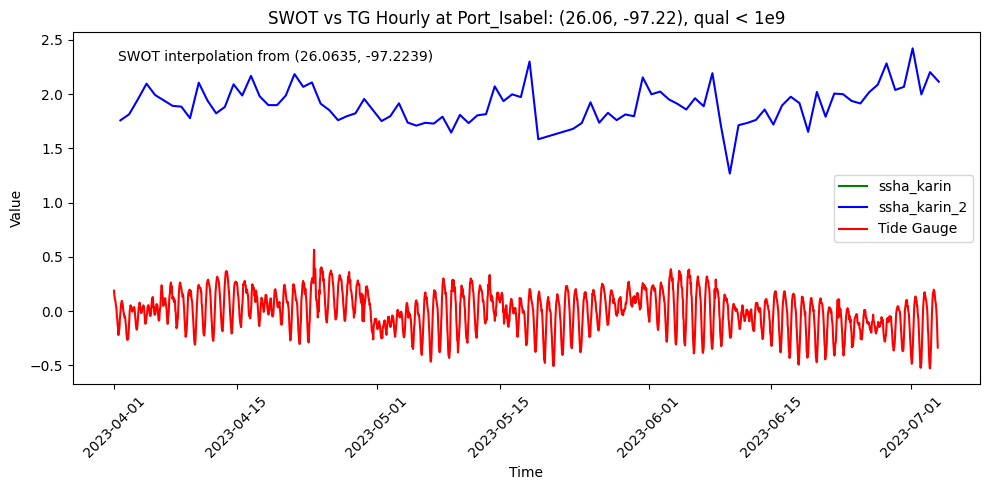

In [34]:
# Repeat with new filtered dataframe, see if we get same closest points and time series

min_count = 90

swot1_interp = {}

for site in valid_sites:
    if site in stations_data:
        swot1_interp[site] = filter_closest_timeseries_with_threshold(
            site, swot_df1, target_lat=stations_data[site]['latitude'].values, 
            target_lon=stations_data[site]['longitude'].values,
            lat_col='latitude', lon_col='longitude', time_col='time', 
            value_col='ssha_karin_2', min_count=min_count)
        plot_swot_tg_time_series_qual1(swot1_interp[site], stations_data[site], site)


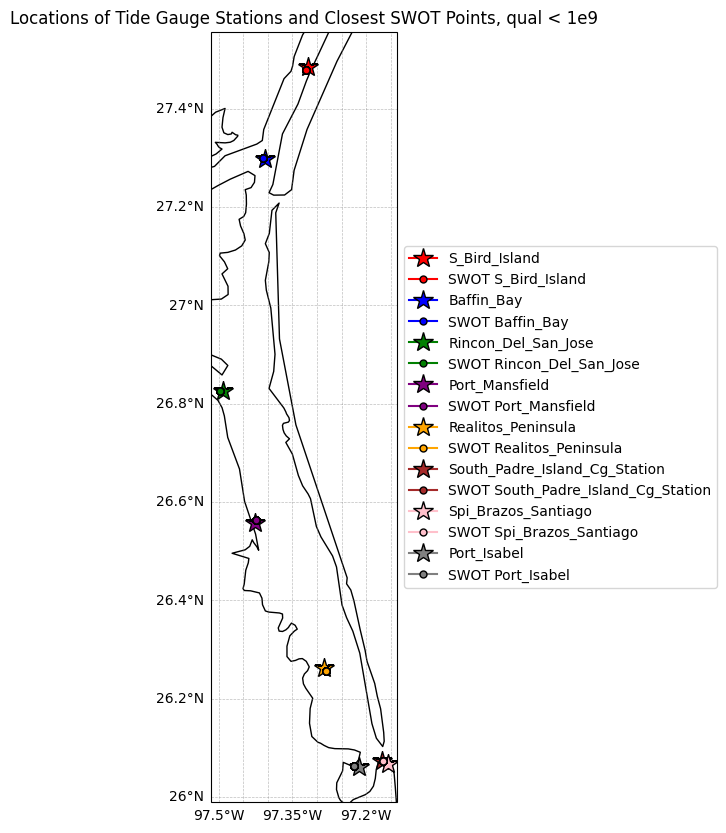

In [35]:
# plot location of swot points and station points to visually confirm closest points
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.LAND, facecolor='white')
ax.add_feature(cfeature.OCEAN, facecolor='white')

# plot station locations and swot closest points
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray']
for idx, site in enumerate(valid_sites):
    if site in stations_data and site in swot1_interp:
        tg_data = stations_data[site]
        swot_data = swot1_interp[site]
        color = colors[idx % len(colors)]
        ax.plot(tg_data['longitude'].values, tg_data['latitude'].values, 
                marker='*', color=color, markersize=15, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=site)
        ax.plot(swot_data['longitude'].values, swot_data['latitude'].values, 
                marker='o', color=color, markersize=5, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=f'SWOT {site}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Locations of Tide Gauge Stations and Closest SWOT Points, qual < 1e9')
plt.show()

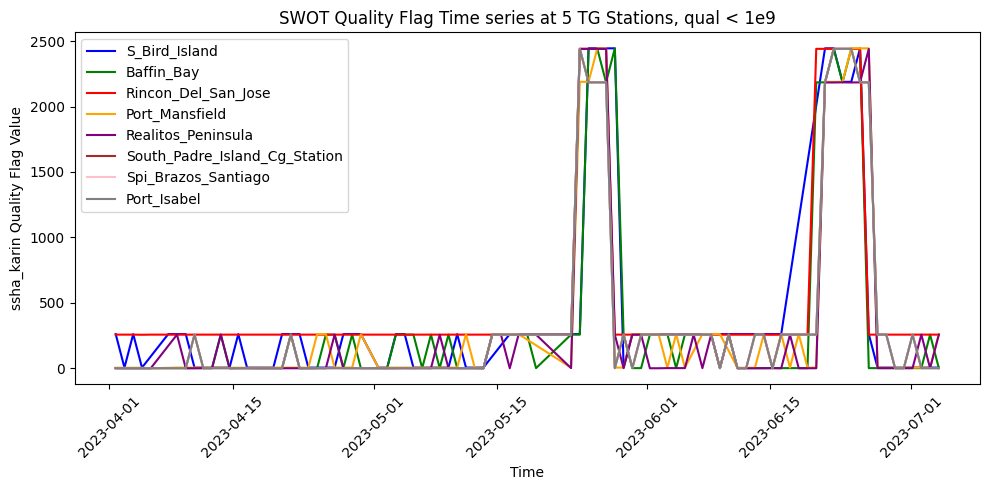

In [38]:
# plot quality flags for all stations on same plot, different colors for each station

plt.figure(figsize=(10, 5))
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'gray']

for idx, site in enumerate(valid_sites):
    if site in swot1_interp:
        plt.plot(swot1_interp[site]['time'], swot1_interp[site]['ssha_karin_2_qual'], 
                label=site, color=colors[idx % len(colors)])

plt.xlabel('Time')  
plt.ylabel('ssha_karin Quality Flag Value')
plt.xticks(rotation=45)
plt.title('SWOT Quality Flag Time series at 5 TG Stations, qual < 1e9')
plt.legend()
plt.tight_layout()
plt.savefig('figures/swot_tg_interp/ssa_karin_quality_flags_all_stations.png', dpi=300)
plt.show()

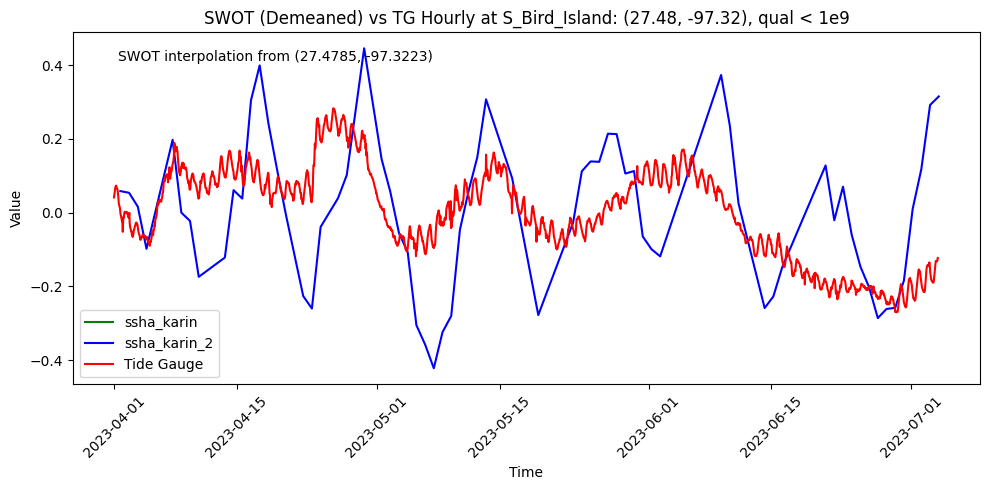

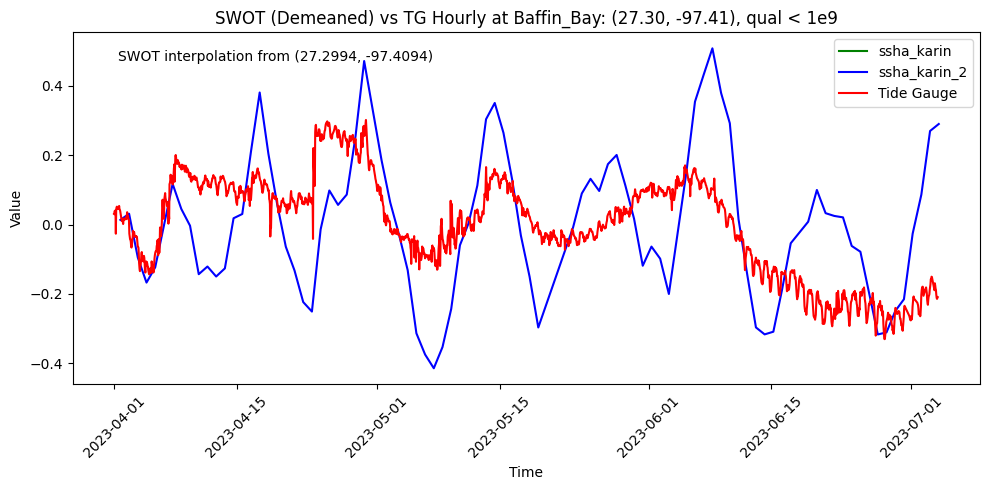

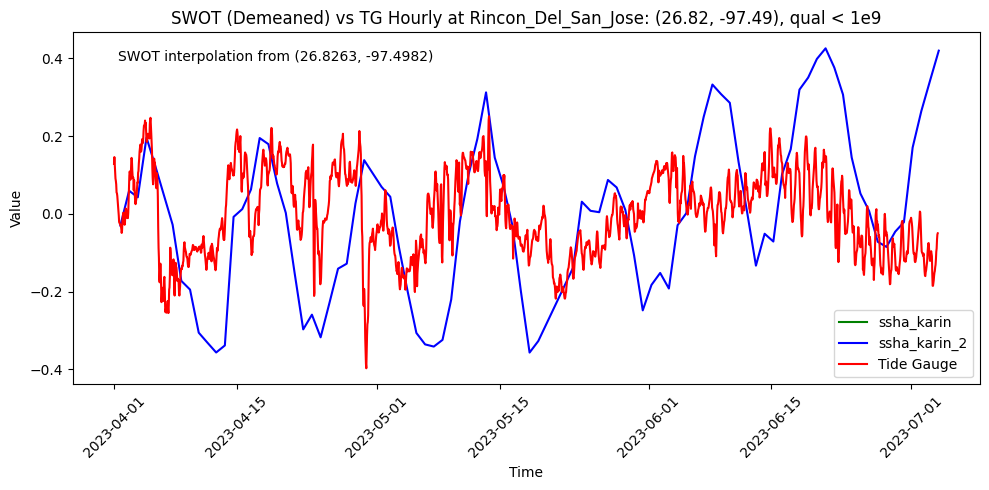

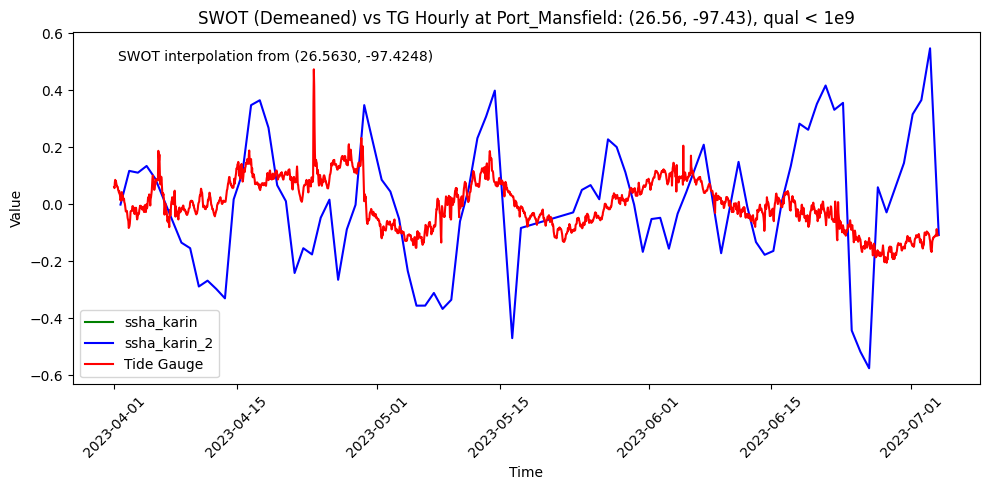

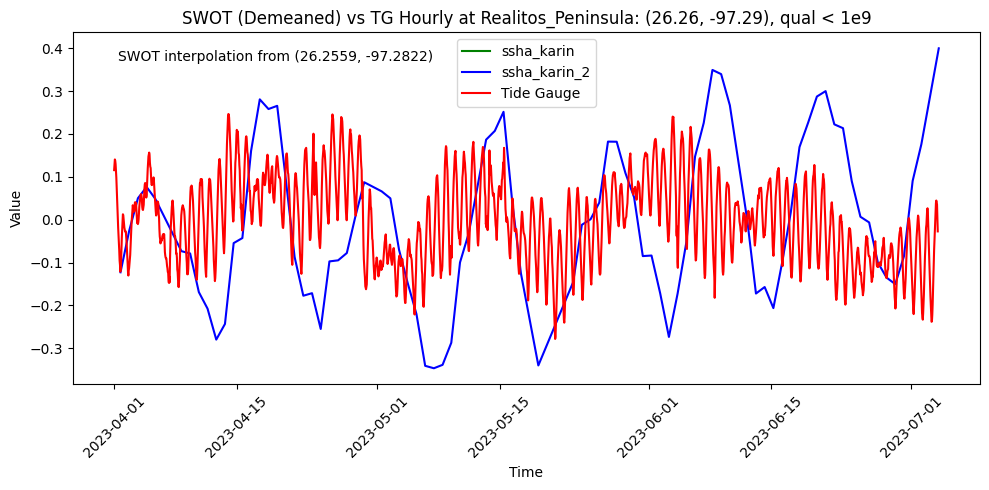

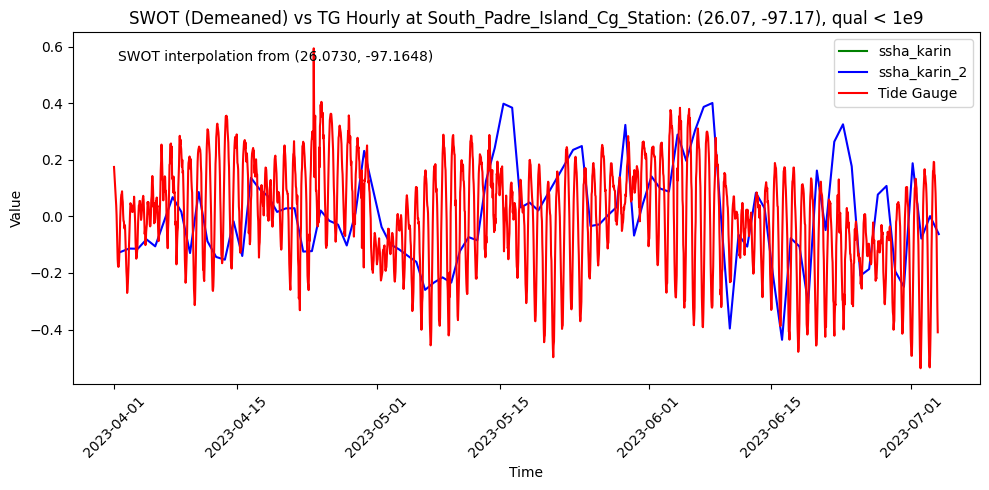

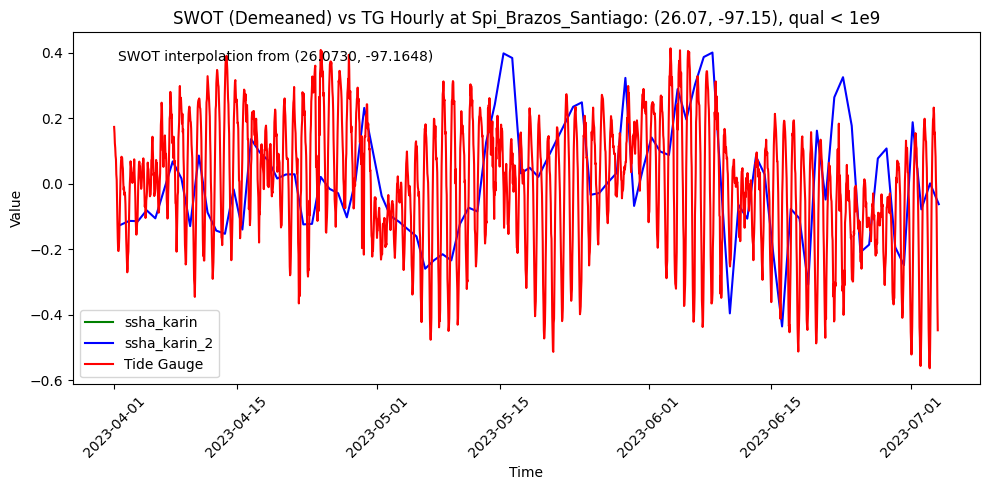

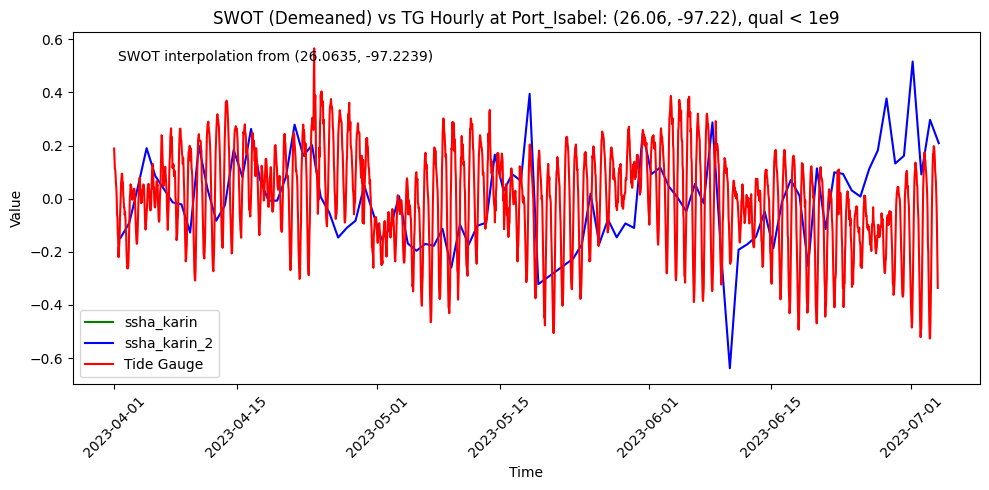

In [39]:
swot1_interp_demeaned = {}
for site in valid_sites:
    if site in swot1_interp:
        swot1_interp_demeaned[site] = demean_swot(swot1_interp[site])

# replot

for site in valid_sites:
    if site in swot1_interp_demeaned and site in stations_data:
        plot_swotdm_tghrly_time_series(swot1_interp_demeaned[site], stations_data[site], site)


In [40]:
# filter by quality flag, only keep data with no issues (quality flag = 0)

swot_df2 = swot_df_dropna[swot_df_dropna['ssha_karin_2_qual'] == 0]

swot_df2

time  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 71        8          0         2023-04-01 17:26:37.387474688   
                                                   1         2023-04-01 17:26:37.387474688   
                                        9          0         2023-04-01 17:26:37.387474688   
                                                   1         2023-04-01 17:26:37.387474688   
                              72        7          0         2023-04-01 17:26:37.697664128   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       62         1         2023-07-04 02:47:01.724514176   
                                        63         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   
                                        64         0         2023-07-04 02:47:01.724514176   
                                                   1         2023-07-04 02:47:01.724514176   

                                                                                  time_tai  \
timec                         num_lines num_pixels num_sides                                 
2023-04-01 17:26:58.949176039 71        8          0         2023-04-01 17:27:14.387475584   
                                                   1         2023-04-01 17:27:14.387475584   
                                        9          0         2023-04-01 17:27:14.387475584   
                                                   1         2023-04-01 17:27:14.387475584   
                              72        7          0         2023-04-01 17:27:14.697664768   
...                                                                                    ...   
2023-07-04 02:46:18.150985132 281       62         1         2023-07-04 02:47:38.724513664   
                                        63         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   
                                        64         0         2023-07-04 02:47:38.724513664   
                                                   1         2023-07-04 02:47:38.724513664   

                                                              ssh_karin  \
timec                         num_lines num_pixels num_sides              
2023-04-01 17:26:58.949176039 71        8          0                NaN   
                                                   1                NaN   
                                        9          0                NaN   
                                                   1                NaN   
                              72        7          0                NaN   
...                                                                 ...   
2023-07-04 02:46:18.150985132 281       62         1           -22.2499   
                                        63         0           -22.2432   
                                                   1           -22.2432   
                                        64         0           -22.2355   
                                                   1           -22.2355   

                                                              ssh_karin_qual  \
timec                         num_lines num_pixels num_sides                   
2023-04-01 17:26:58.949176039 71        8          0            2.684355e+09   
                                                   1            2.684355e+09   
                                        9          0            2.684355e+09   
                                                   1            2.684355e+09   
                              72        7          0            2.684355e+09   
...                                                                      ...   
2023-07-04 02:46:18.1509

In [41]:
# Repeat with new filtered dataframe, see if we get same closest points and time series

min_count = 90

#dictionary of time series for each station
swot_interp2 = {}

for site in valid_sites:
    print(f"Processing site: {site}")
    site_data = stations_data[site]
    swot_interp2[site] = filter_closest_timeseries_with_threshold(
        station_name, swot_df2, target_lat=site_data['latitude'], 
        target_lon=site_data['longitude'], lat_col='latitude', lon_col='longitude',
        time_col='time', value_col='ssha_karin_2', min_count=min_count)


Processing site: S_Bird_Island
Closest point with at least 90 entries: (27.4284, -97.2916) with 132 entries.
Processing site: Baffin_Bay
Closest point with at least 90 entries: (27.2880, -97.3660) with 116 entries.
Processing site: Rincon_Del_San_Jose
Closest point with at least 90 entries: (26.8359, -97.4388) with 160 entries.
Processing site: Port_Mansfield
Closest point with at least 90 entries: (26.5339, -97.3782) with 90 entries.
Processing site: Realitos_Peninsula
Closest point with at least 90 entries: (26.2737, -97.2857) with 132 entries.
Processing site: South_Padre_Island_Cg_Station
Closest point with at least 90 entries: (26.0761, -97.1451) with 94 entries.
Processing site: Spi_Brazos_Santiago
Closest point with at least 90 entries: (26.0761, -97.1451) with 94 entries.
Processing site: Port_Isabel
Closest point with at least 90 entries: (26.0761, -97.1451) with 94 entries.


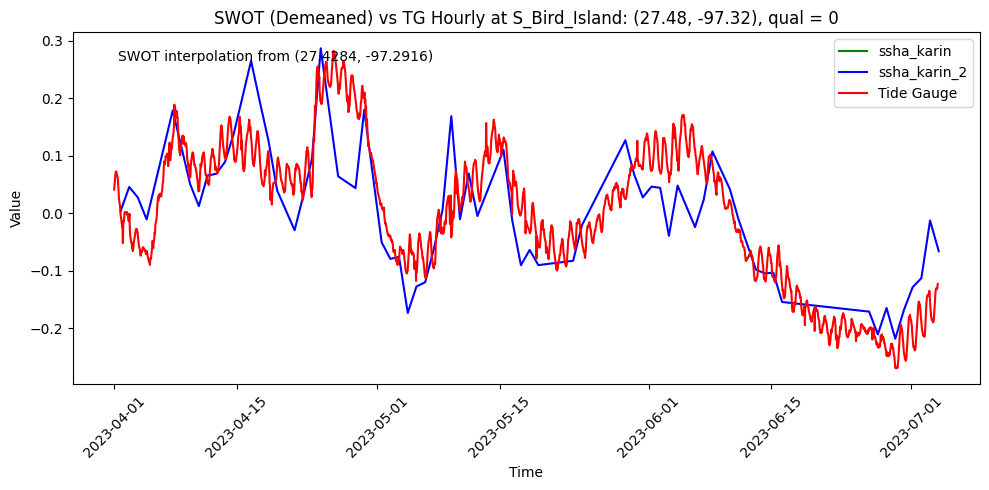

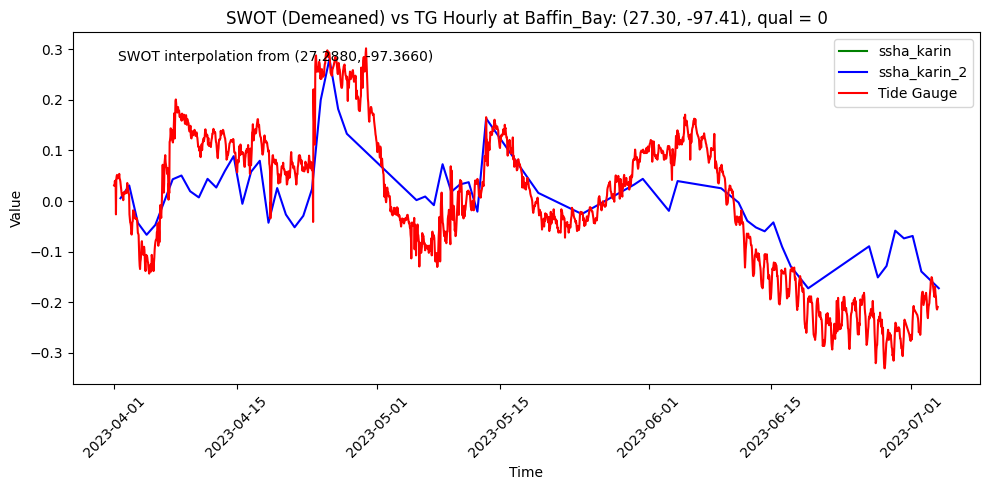

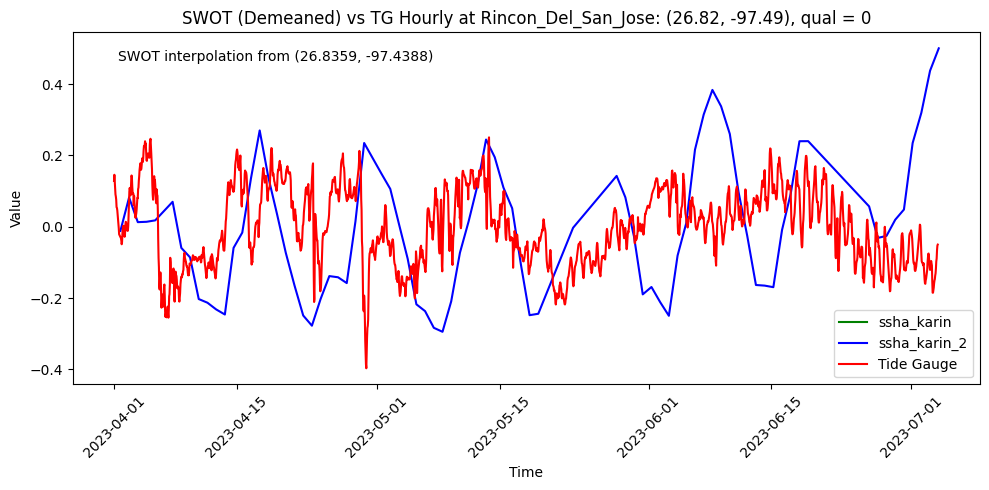

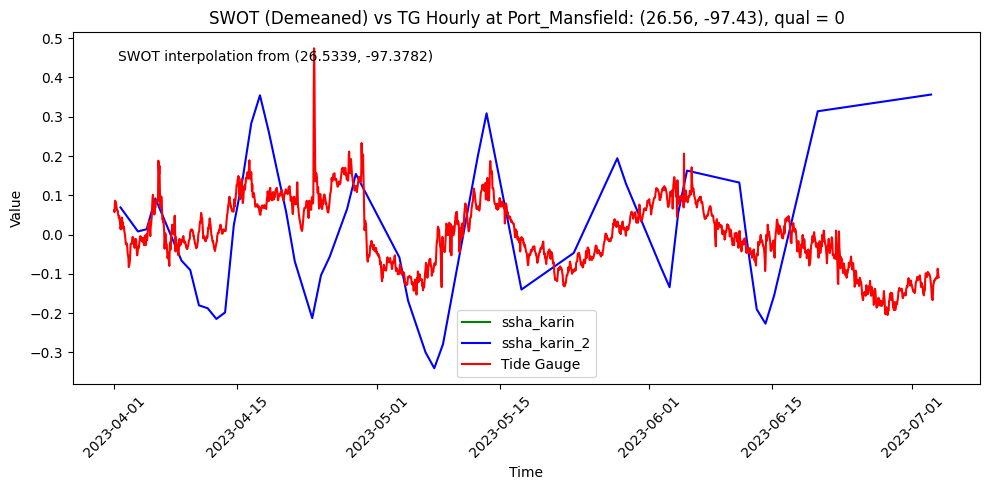

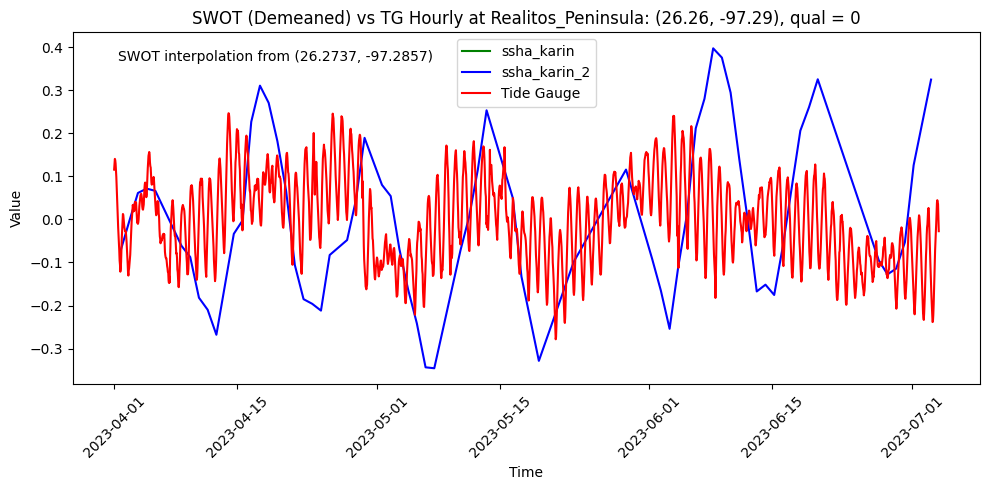

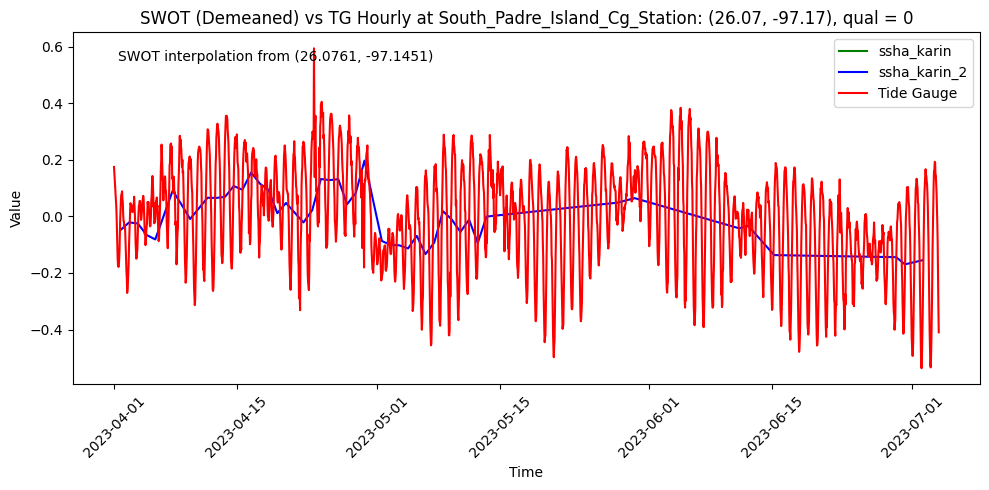

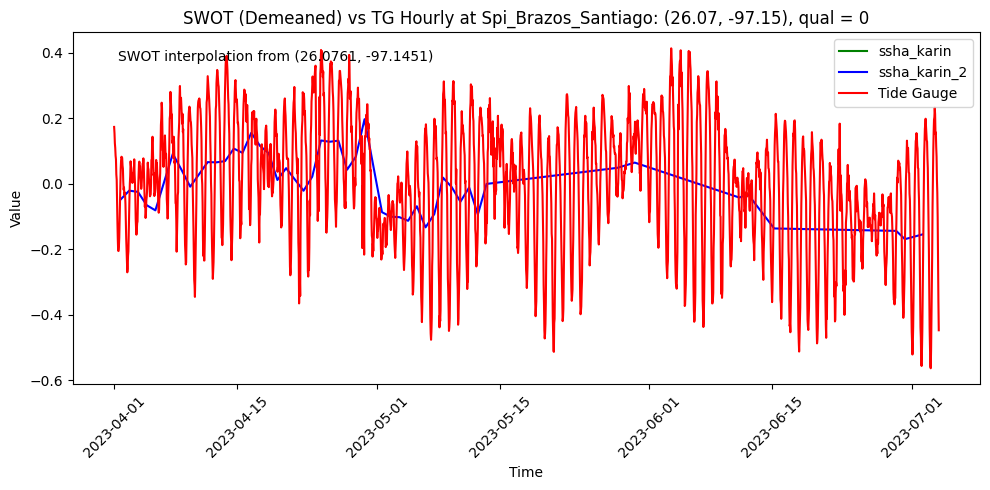

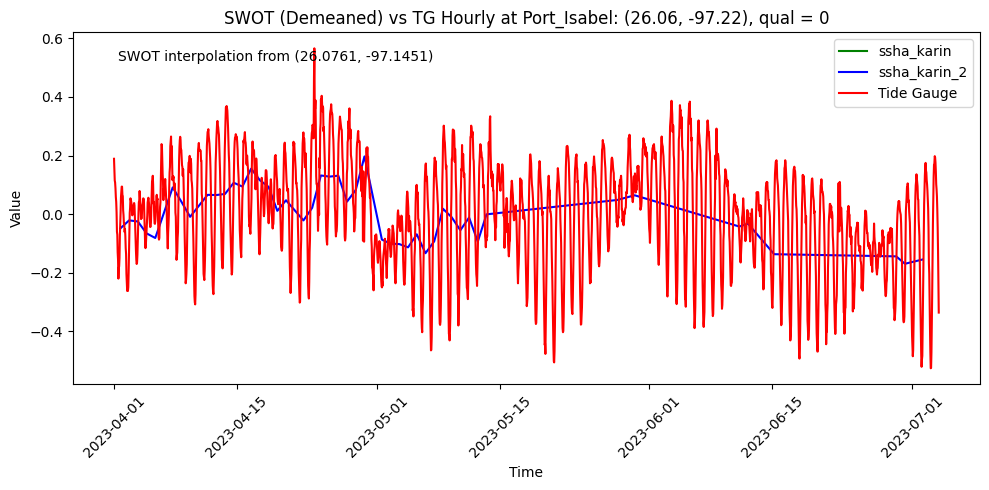

In [43]:
swot_interp2_demeaned = {}
for site in valid_sites:
    if site in swot_interp2:
        swot_interp2_demeaned[site] = demean_swot(swot_interp2[site])

# replot

for site in valid_sites:
    if site in swot_interp2_demeaned and site in stations_data:
        plot_swotdm_tghrly_time_series(swot_interp2_demeaned[site], stations_data[site], site)


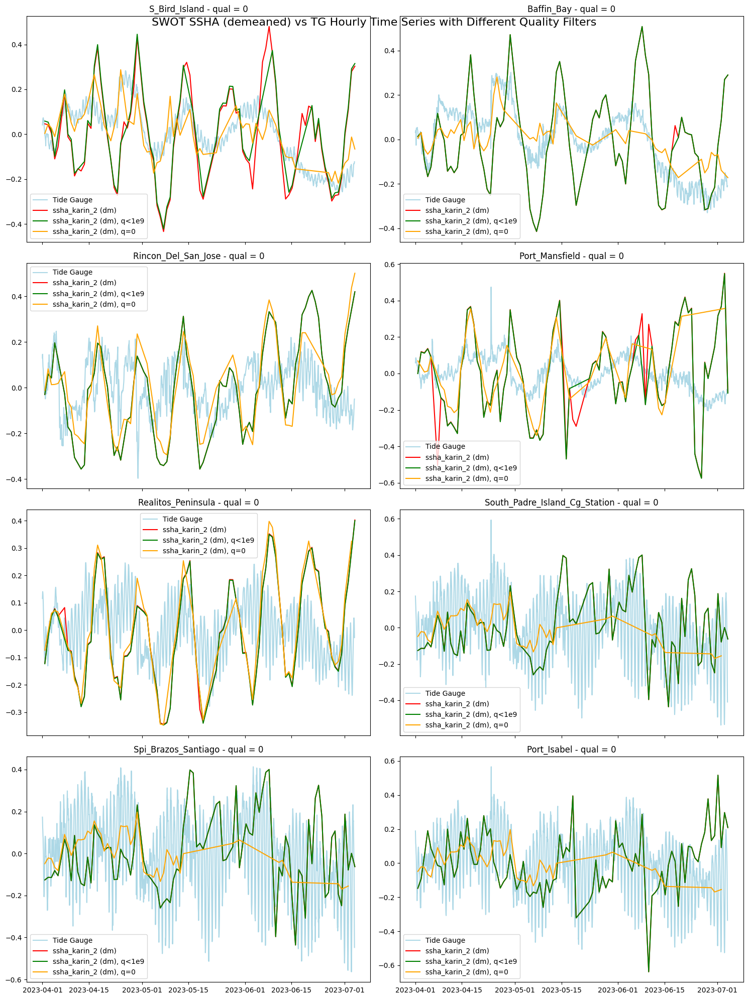

In [58]:
# based on plot functions above, make 4x2 subplot of all stations, with original time series, quality filtered time series, and quality flags
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20), sharex=True)
axes = axes.flatten()
for idx, site in enumerate(valid_sites):
    if site in stations_data:
        tg_ds = stations_data[site]
        swot_orig = swot_interp_demeaned[site]
        swot_qual1 = swot1_interp_demeaned[site]
        swot_qual2 = swot_interp2_demeaned[site]

        # Original time series
        axes[idx].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='lightblue')
        axes[idx].plot(swot_orig['time'], swot_orig['ssha_karin_2'] + swot_orig['height_cor_xover'], label='ssha_karin_2 (dm)', color='red')

        axes[idx].set_title(f'{site} - Original')
        axes[idx].legend()

        # Quality filtered (qual < 1e9)
        axes[idx].plot(swot_qual1['time'], swot_qual1['ssha_karin_2'] + swot_qual1['height_cor_xover'], label='ssha_karin_2 (dm), q<1e9', color='green')
        #axes[idx].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='red')
        axes[idx].set_title(f'{site} - qual < 1e9')
        axes[idx].legend()

        # Quality filtered (qual = 0)
        axes[idx].plot(swot_qual2['time'], swot_qual2['ssha_karin_2'] + swot_qual2['height_cor_xover'], label='ssha_karin_2 (dm), q=0', color='orange')
        #axes[idx].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='red')
        axes[idx].set_title(f'{site} - qual = 0')
        axes[idx].legend()
plt.tight_layout()
plt.suptitle('SWOT SSHA (demeaned) vs TG Hourly Time Series with Different Quality Filters', fontsize=16)
plt.savefig('figures/swot_tg_interp/swote2_tg_time_series_all_stations.png', dpi=300)
plt.show()

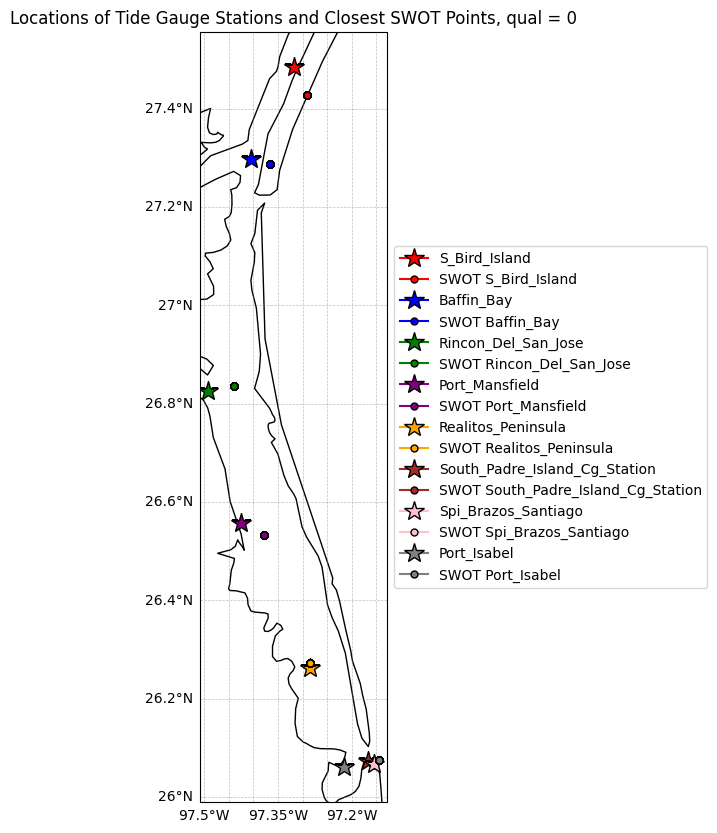

In [60]:
# plot location of swot points and station points to visually confirm closest points
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.LAND, facecolor='white')
ax.add_feature(cfeature.OCEAN, facecolor='white')

# plot station locations and swot closest points
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray']
for idx, site in enumerate(valid_sites):
    if site in stations_data and site in swot_interp2:
        tg_data = stations_data[site]
        swot_data = swot_interp2[site]
        color = colors[idx % len(colors)]
        ax.plot(tg_data['longitude'].values, tg_data['latitude'].values, 
                marker='*', color=color, markersize=15, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=site)
        ax.plot(swot_data['longitude'].values, swot_data['latitude'].values, 
                marker='o', color=color, markersize=5, mec='black', 
                transform=ccrs.PlateCarree(), zorder=10, label=f'SWOT {site}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Locations of Tide Gauge Stations and Closest SWOT Points, qual = 0')
plt.show()

In [ ]:
import pandas as pd
import xarray as xr

def apply_ibc_correction(tg_data, swot_data):
    tg_data_ibc = tg_data.copy()
    
    # daily IBC from SWOT table
    swot_daily = (
        swot_data.assign(day=swot_data["time"].dt.floor("D"))
        .drop_duplicates("day")
        .set_index("day")["dac"]
    )
    
    # map each tide-gauge time to a daily correction
    tg_days = pd.to_datetime(tg_data_ibc["time"].values).floor("D")
    corr = pd.Series(tg_days).map(swot_daily).fillna(0.0).to_numpy()
    
    corr_da = xr.DataArray(corr, dims=["time"], coords={"time": tg_data_ibc["time"]})
    
    # sea_level is (time, xtgstn), so this broadcasts across xtgstn
    tg_data_ibc["sea_level"] = tg_data_ibc["sea_level"] - corr_da
    tg_data_ibc["rel_sea_level"] = tg_data_ibc["sea_level"] - tg_data_ibc["sea_level"].mean()
    
    return tg_data_ibc

# Apply IBC correction to all stations
stations_data_ibc = {}
for site in valid_sites:
    if site in stations_data and site in swot_interp2_demeaned:
        stations_data_ibc[site] = apply_ibc_correction(stations_data[site], swot_interp2_demeaned[site])


In [81]:
swot_interp2_demeaned[site]['inv_bar_cor']

timec                          num_lines  num_pixels  num_sides
2023-04-01 17:26:58.949176039  168        17          0           -0.0691
                                                      1           -0.0691
2023-04-02 17:17:36.730266133  168        17          0           -0.0193
                                                      1           -0.0193
2023-04-03 17:08:14.479179814  168        17          0            0.0342
                                                                    ...  
2023-06-29 03:33:08.379214274  168        17          1           -0.0108
2023-06-30 03:23:46.160346868  168        17          0           -0.0164
                                                      1           -0.0164
2023-07-02 03:05:02.106570506  168        17          0           -0.0115
                                                      1           -0.0115
Name: inv_bar_cor, Length: 94, dtype: float64

In [74]:
stations_data_ibc['Baffin_Bay']

<xarray.Dataset> Size: 89kB
Dimensions:        (time: 2226)
Coordinates:
  * time           (time) datetime64[ns] 18kB 2023-04-01 ... 2023-07-04
Data variables:
    sea_level      (time) float64 18kB ...
    rel_sea_level  (time) float64 18kB 4.343 4.342 4.352 ... 4.098 4.101 4.103
    qc_flag        (time) int64 18kB ...
    use_flag       (time) int64 18kB ...
    latitude       float64 8B 27.3
    longitude      float64 8B -97.41

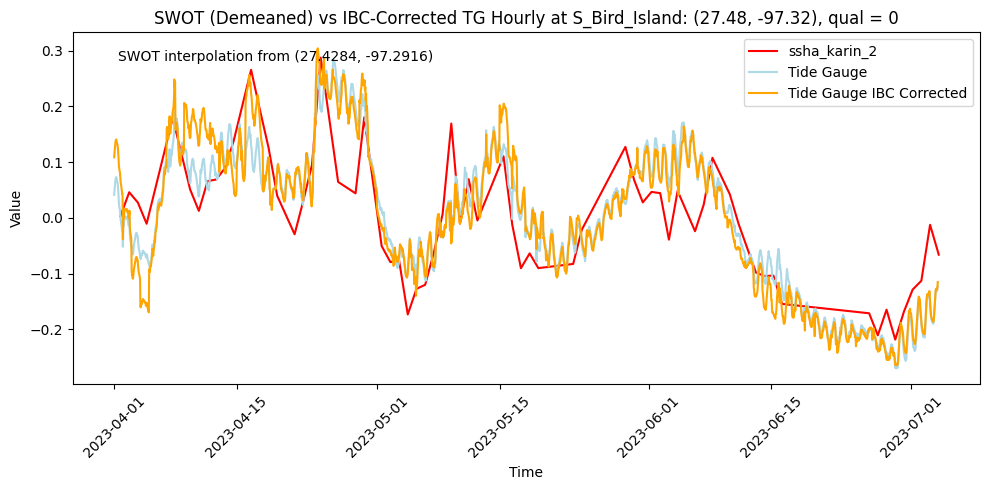

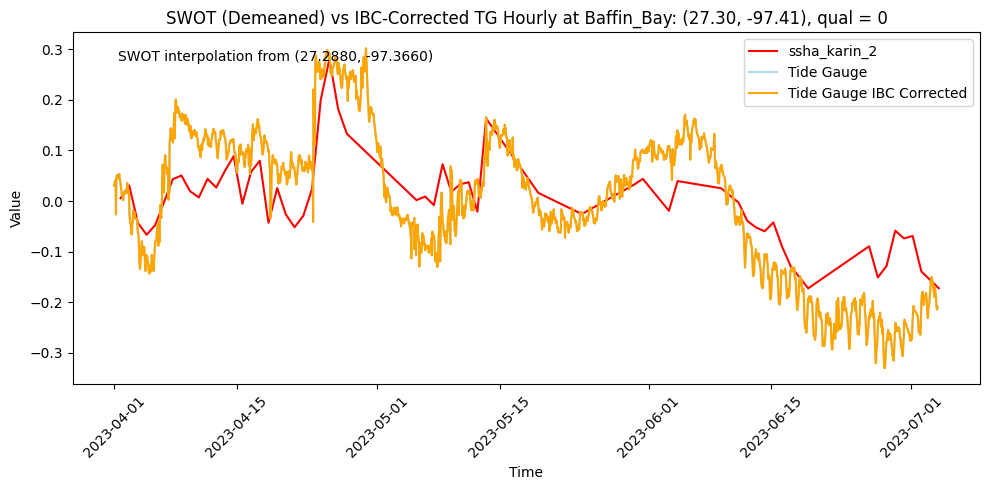

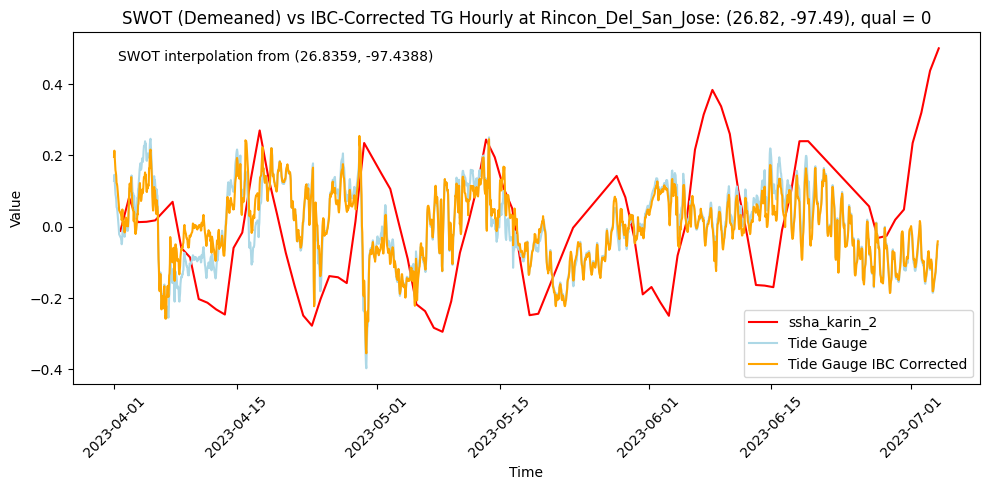

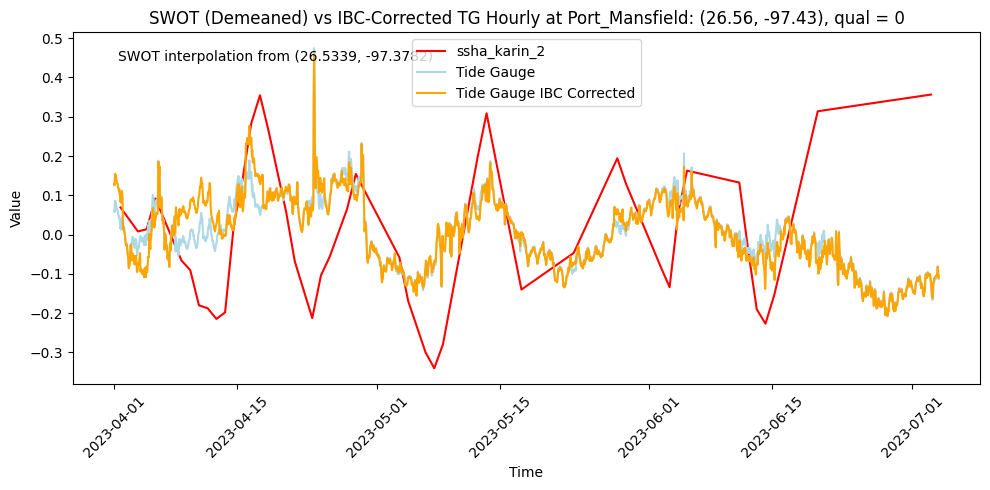

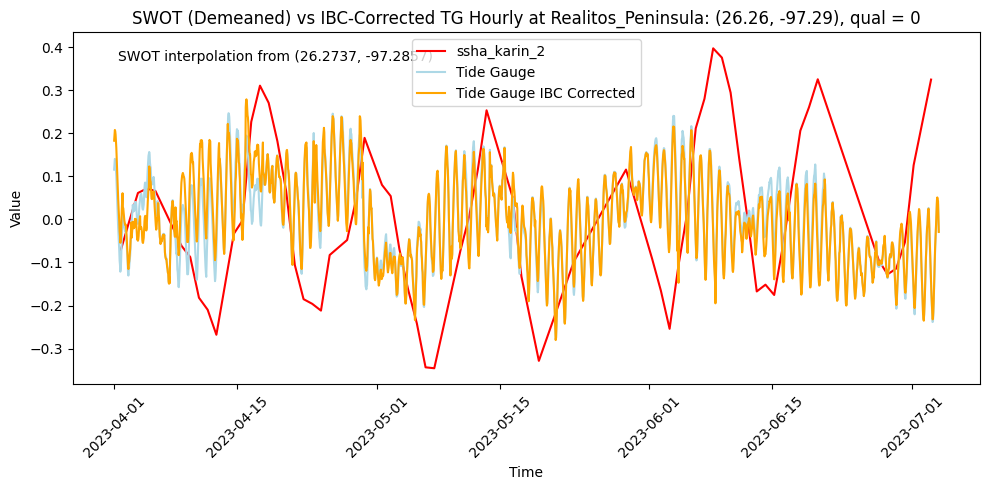

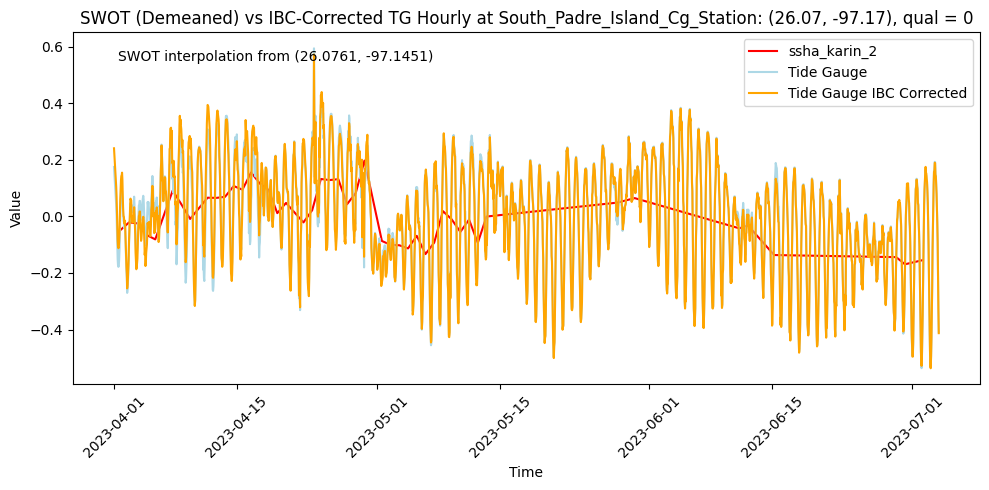

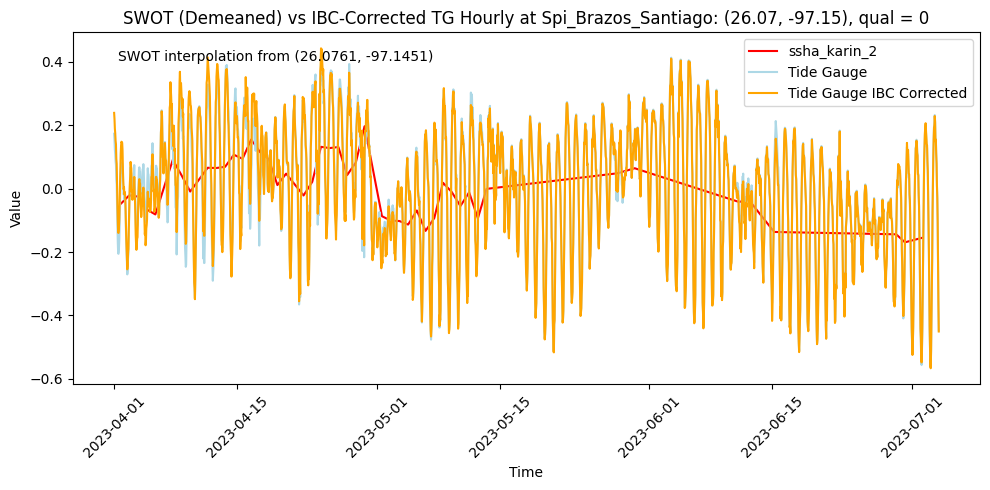

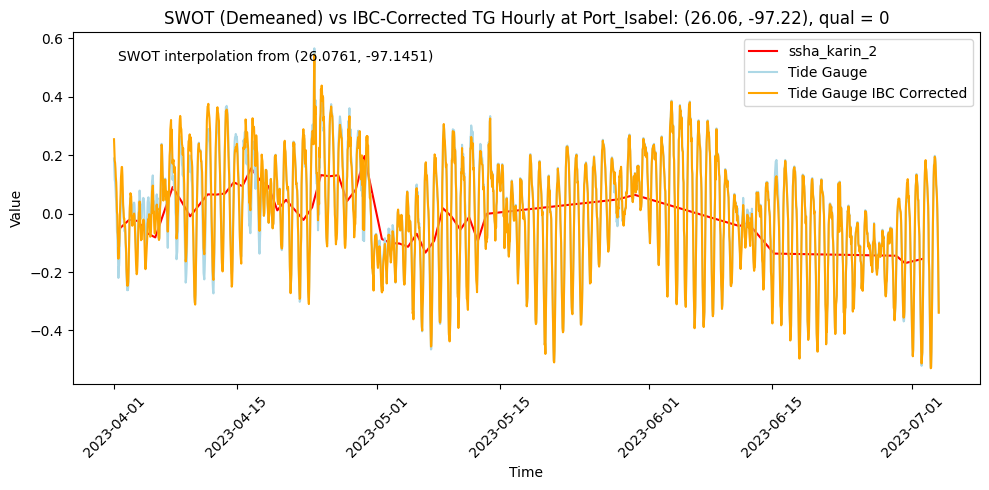

In [85]:
# now plot again

for idx, site in enumerate(valid_sites):
    if site in swot_interp2_demeaned and site in stations_data_ibc:
        plot_swotdm_tghrly_time_series_ibc(swot_interp2_demeaned[site], stations_data[site], stations_data_ibc[site], site)




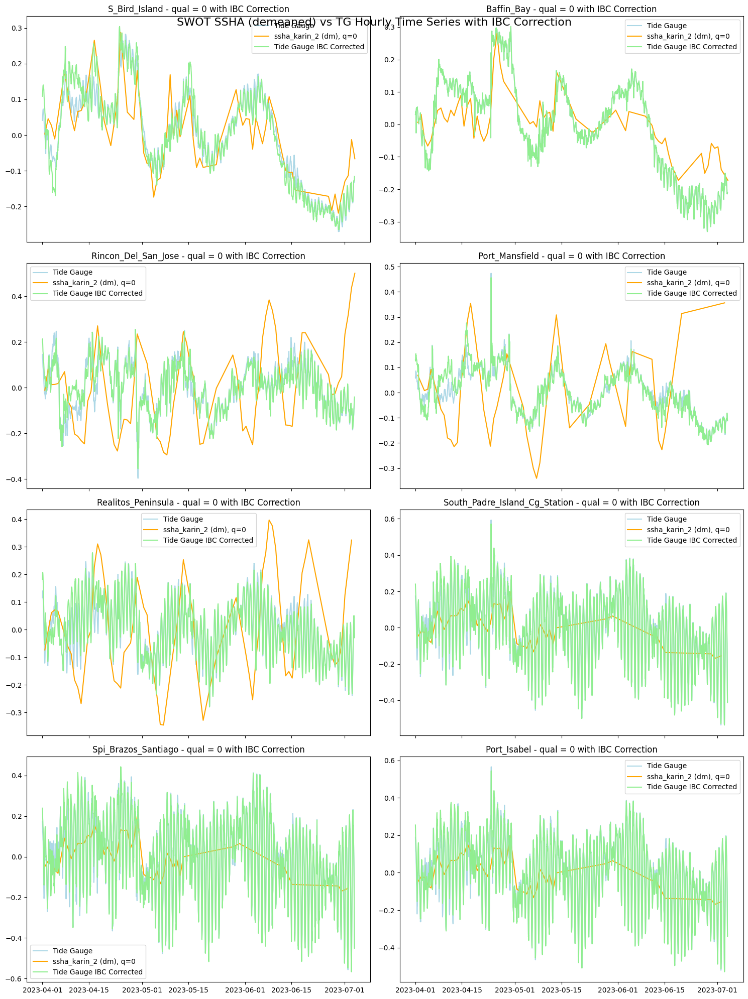

In [90]:
# plot above time series as 4x2 subplot for all stations
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20), sharex=True)
axes = axes.flatten()
for idx, site in enumerate(valid_sites):
    if site in stations_data and site in swot_interp2_demeaned and site in stations_data_ibc:
        tg_ds = stations_data[site]
        tg_ds_ibc = stations_data_ibc[site]
        swot_qual2 = swot_interp2_demeaned[site]

        # Original time series
        axes[idx].plot(tg_ds['time'].values, tg_ds['rel_sea_level'].values, label='Tide Gauge', color='lightblue')
        axes[idx].plot(swot_qual2['time'], swot_qual2['ssha_karin_2'] + swot_qual2['height_cor_xover'], label='ssha_karin_2 (dm), q=0', color='orange')

        axes[idx].set_title(f'{site} - qual = 0')
        axes[idx].legend()

        # IBC corrected
        axes[idx].plot(tg_ds_ibc['time'].values, tg_ds_ibc['rel_sea_level'].values, label='Tide Gauge IBC Corrected', color='lightgreen')
        axes[idx].set_title(f'{site} - qual = 0 with IBC Correction')
        axes[idx].legend()
plt.tight_layout()
plt.suptitle('SWOT SSHA (demeaned) vs TG Hourly Time Series with IBC Correction', fontsize=16)
plt.savefig('figures/swot_tg_interp/swote2_tg_time_series_all_stations_ibc.png', dpi=300)
plt.show()  

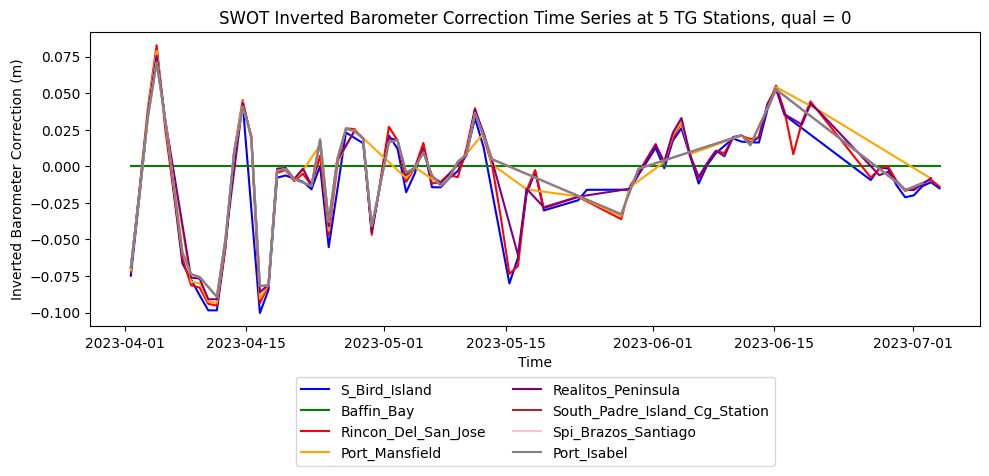

In [86]:
# plot all stations' inverted barometer corrections on same plot
plt.figure(figsize=(10, 5))
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'gray']
for idx, site in enumerate(valid_sites):
    if site in swot_interp2_demeaned:
        plt.plot(swot_interp2_demeaned[site]['time'], swot_interp2_demeaned[site]['inv_bar_cor'], 
                label=site, color=colors[idx % len(colors)])
plt.xlabel('Time')
plt.ylabel('Inverted Barometer Correction (m)')
plt.title('SWOT Inverted Barometer Correction Time Series at 5 TG Stations, qual = 0')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.tight_layout()
plt.savefig('figures/swot_tg_interp/swot_inverted_barometer_correction_all_stations.png', dpi=300)
plt.show()